# Diagram of Scene Attributes

by Nan BAI

In [1]:
import torch
from torch.autograd import Variable as V
import torchvision.models as models
from torchvision import transforms as trn
from torch.nn import functional as F
import os
import numpy as np
import cv2
from PIL import Image
from PIL.ImageOps import colorize
import pandas as pd

In [2]:
print("PyTorch version {}".format(torch.__version__))
print("GPU-enabled installation? {}".format(torch.cuda.is_available()))

PyTorch version 1.10.2+cu113
GPU-enabled installation? True


In [3]:
device = torch.device("cuda:0") if torch.cuda.is_available() else torch.device("cpu")
print(device)

cuda:0


In [3]:
# hacky way to deal with the Pytorch 1.0 update
def recursion_change_bn(module):
    if isinstance(module, torch.nn.BatchNorm2d):
        module.track_running_stats = 1
    else:
        for i, (name, module1) in enumerate(module._modules.items()):
            module1 = recursion_change_bn(module1)
    return module

In [4]:
def load_labels():
    # prepare all the labels
    # scene category relevant
    file_name_category = 'categories_places365.txt'
    if not os.access(file_name_category, os.W_OK):
        synset_url = 'https://raw.githubusercontent.com/csailvision/places365/master/categories_places365.txt'
        os.system('wget ' + synset_url)
    classes = list()
    with open(file_name_category) as class_file:
        for line in class_file:
            classes.append(line.strip().split(' ')[0][3:])
    classes = tuple(classes)

    # indoor and outdoor relevant
    file_name_IO = 'IO_places365.txt'
    if not os.access(file_name_IO, os.W_OK):
        synset_url = 'https://raw.githubusercontent.com/csailvision/places365/master/IO_places365.txt'
        os.system('wget ' + synset_url)
    with open(file_name_IO) as f:
        lines = f.readlines()
        labels_IO = []
        for line in lines:
            items = line.rstrip().split()
            labels_IO.append(int(items[-1]) -1) # 0 is indoor, 1 is outdoor
    labels_IO = np.array(labels_IO)

    # scene attribute relevant
    file_name_attribute = 'labels_sunattribute.txt'
    if not os.access(file_name_attribute, os.W_OK):
        synset_url = 'https://raw.githubusercontent.com/csailvision/places365/master/labels_sunattribute.txt'
        os.system('wget ' + synset_url)
    with open(file_name_attribute) as f:
        lines = f.readlines()
        labels_attribute = [item.rstrip() for item in lines]
    file_name_W = 'W_sceneattribute_wideresnet18.npy'
    if not os.access(file_name_W, os.W_OK):
        synset_url = 'http://places2.csail.mit.edu/models_places365/W_sceneattribute_wideresnet18.npy'
        os.system('wget ' + synset_url)
    W_attribute = np.load(file_name_W)

    return classes, labels_IO, labels_attribute, W_attribute

In [5]:
def hook_feature(module, input, output):
    features_blobs.append(np.squeeze(output.data.cpu().numpy()))

def returnCAM(feature_conv, weight_softmax, class_idx):
    # generate the class activation maps upsample to 256x256
    size_upsample = (256, 256)
    nc, h, w = feature_conv.shape
    output_cam = []
    for idx in class_idx:
        cam = weight_softmax[class_idx].dot(feature_conv.reshape((nc, h*w)))
        cam = cam.reshape(h, w)
        cam = cam - np.min(cam)
        cam_img = cam / np.max(cam)
        cam_img = np.uint8(255 * cam_img)
        output_cam.append(cv2.resize(cam_img, size_upsample))
    return output_cam

def returnTF():
# load the image transformer
    tf = trn.Compose([
        trn.Resize((224,224)),
        trn.ToTensor(),
        trn.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])
    return tf

In [6]:
def load_model():
    # this model has a last conv feature map as 14x14

    model_file = 'wideresnet18_places365.pth.tar'
    if not os.access(model_file, os.W_OK):
        os.system('wget http://places2.csail.mit.edu/models_places365/' + model_file)
        os.system('wget https://raw.githubusercontent.com/csailvision/places365/master/wideresnet.py')

    import wideresnet
    model = wideresnet.resnet18(num_classes=365)
    checkpoint = torch.load(model_file, map_location=lambda storage, loc: storage)
    state_dict = {str.replace(k,'module.',''): v for k,v in checkpoint['state_dict'].items()}
    model.load_state_dict(state_dict)
    
    # hacky way to deal with the upgraded batchnorm2D and avgpool layers...
    for i, (name, module) in enumerate(model._modules.items()):
        module = recursion_change_bn(model)
    model.avgpool = torch.nn.AvgPool2d(kernel_size=14, stride=1, padding=0)
    
    model.eval()



    # the following is deprecated, everything is migrated to python36

    ## if you encounter the UnicodeDecodeError when use python3 to load the model, add the following line will fix it. Thanks to @soravux
    #from functools import partial
    #import pickle
    #pickle.load = partial(pickle.load, encoding="latin1")
    #pickle.Unpickler = partial(pickle.Unpickler, encoding="latin1")
    #model = torch.load(model_file, map_location=lambda storage, loc: storage, pickle_module=pickle)

    #model.eval()
    # hook the feature extractor
    features_names = ['layer4','avgpool'] # this is the last conv layer of the resnet
    for name in features_names:
        model._modules.get(name).register_forward_hook(hook_feature)
    return model

In [7]:
# load the labels
classes, labels_IO, labels_attribute, W_attribute = load_labels()

# load the model
features_blobs = []
model = load_model()

# load the transformer
tf = returnTF() # image transformer

# get the softmax weight
params = list(model.parameters())
weight_softmax = params[-2].data.numpy()
weight_softmax[weight_softmax<0] = 0

In [7]:
W_attribute.shape

(102, 512)

In [8]:
def load_images(images_folder):
    all_images = []
    for file in os.listdir(images_folder):
        if os.path.splitext(file)[1].lower() in ('.jpg', '.jpeg', '.png'):
            all_images.append(file)
    return all_images

In [9]:
def load_images_from_category_folders(images_folder):
    all_images = {}
    all_imgs = []
    categories = []
    category_dict = {}
    for file in os.listdir(images_folder):
        if os.path.isdir(images_folder + '/' + file):
            print(file)
            categories.append(file)
            category_dict[len(category_dict)] = file
            all_images[file] = []
            for f in os.listdir(images_folder + '/' + file):
                if os.path.splitext(f)[1].lower() in ('.jpg', '.jpeg', '.png'):
                    all_images[file].append(f)
                    all_imgs.append((f, file, len(categories)))
    return all_images, all_imgs, categories, category_dict

In [10]:
images_folder = 'data_storage/images/5km/150/'
all_images = load_images(images_folder)

In [694]:
images_folder_320 = 'data_storage/images/5km/320/'
all_images_320 = load_images(images_folder_320)

In [695]:
images_folder_150 = 'data_storage/images/5km/150/'
all_images_150 = load_images(images_folder_150)

In [20]:
images_folder_320 = 'Venezia/data_storage/images/320/'
all_images_320 = load_images(images_folder_320)

In [11]:
images_folder_150 = 'Venezia/data_storage/images/150/'
all_images_150 = load_images(images_folder_150)

In [66]:
images_folder_320_S = 'Suzhou/data_storage/images/320/'
all_images_320_S = load_images(images_folder_320_S)

In [12]:
images_folder_150_S = 'Suzhou/data_storage/images/150/'
all_images_150_S = load_images(images_folder_150_S)

In [12]:
images_folder_320_A = 'Amsterdam/data_storage/images/320/'
all_images_320_A = load_images(images_folder_320_A)

In [13]:
images_folder_150_A = 'Amsterdam/data_storage/images/150/'
all_images_150_A = load_images(images_folder_150_A)

In [13]:
images_folder_150_L = 'data_storage/images/grid-150/'
all_images_150_L = load_images(images_folder_150_L)

In [21]:
images_folder = 'data_storage/images/grid-150/'
all_images = load_images(images_folder)

In [14]:
images_folder_Tripoli = 'Tripoli/data_storage/images'
all_images_dict, all_images_Tripoli, categories, cat_dict = load_images_from_category_folders(images_folder_Tripoli)

architectural elements
form
gastronomy
interior
landscape scenery and natural features
monuments
people
product
urban scenery


In [14]:
def get_one_image(ID, all_images, images_folder):
    # load the test image
    if type(all_images[0]) is tuple:
        img_name = all_images[ID][0]
        img = Image.open(images_folder + '/' + all_images[ID][1] +'/'+img_name)
    else:
        img_name = all_images[ID]
        #os.system('wget %s -q -O test.jpg' % img_url)
        img = Image.open(images_folder + img_name)
    if img.mode == 'L':
        img = colorize(img, black=(0,0,0), white=(255,255,255))
    if img.mode == 'CMYK':
        img = img.convert('RGB')
    tf = returnTF()
    input_img = V(tf(img).unsqueeze(0))
    return img_name, img, input_img

In [15]:
def get_one_image_name(name, all_images, images_folder):
    if type(all_images[0]) is tuple:
        img_list = [a[0] for a in all_images]
        cat_list = [a[1] for a in all_images]
        assert name+'.jpg' in [a[0] for a in all_images]
        ID = img_list.index(name+'.jpg')
        img = Image.open(images_folder + '/' + cat_list[ID] +'/'+name+ '.jpg')
    else:
        assert name+'.jpg' in all_images
        img = Image.open(images_folder + name + '.jpg')
          
    if img.mode == 'L':
        img = colorize(img, black=(0,0,0), white=(255,255,255))
    input_img = V(tf(img).unsqueeze(0))
    return img, input_img

In [14]:
def process_one_image(input_img, model):
    # forward pass
    logit = model.forward(input_img)
    h_x = F.softmax(logit, 1).data.squeeze()
    probs, idx = h_x.sort(-1, True)
    probs = probs.numpy()
    idx = idx.numpy()
    
    return probs, idx

In [18]:
def report_one_image(input_img, model=model, features_blobs=features_blobs,
                    attr_num = 10, places_num = 10, W_attribute = W_attribute, classes=classes,
                     labels_attribute = labels_attribute, labels_IO=labels_IO):
    probs, idx= process_one_image(input_img, model)
    features_blobs = features_blobs[-2:]
    report = {}
    # output the IO prediction
    io_image = np.mean(labels_IO[idx[:10]]) # vote for the indoor or outdoor
    if io_image < 0.5:
        report['TYPE OF ENVIRONMENT']='indoor'
    else:
        report['TYPE OF ENVIRONMENT']='outdoor'
        
    # output the prediction of scene category    
    report['PRED'] = [(probs[i], classes[idx[i]], idx[i]) for i in range(0,places_num)]
    
    # output the scene attributes
    responses_attribute = W_attribute.dot(features_blobs[-1])
    #print(responses_attribute[0],len(responses_attribute), features_blobs[-1].shape)
    #print(responses_attribute.shape)
    idx_a = np.argsort(responses_attribute)
    report['SCENE ATTRIBUTES'] =[(labels_attribute[idx_a[i]],idx_a[i]) for i in range(-1,-1*attr_num-1,-1)]
    
    #output the image features
    report['FEATURES'] = features_blobs[-1]

    return report

In [19]:
def report_many_images(input_img, image_names, model=model, features_blobs=features_blobs,
                       attr_num = 10, places_num = 10, W_attribute = W_attribute, classes=classes,
                       labels_attribute = labels_attribute, labels_IO = labels_IO):
    if len(image_names)==1:
        return report_one_image(input_img, model=model, features_blobs=features_blobs,
                    attr_num = 10, places_num = 10, W_attribute = W_attribute, classes=classes,
                     labels_attribute = labels_attribute, labels_IO=labels_IO)
    
    probs, idx= process_one_image(input_img, model)
    features_blobs = features_blobs[-2:]
    all_report = {}
    
    for n in range(len(image_names)):
        report = {}
        # output the IO prediction
        io_image = np.mean(labels_IO[idx[n][:10]]) # vote for the indoor or outdoor
        if io_image < 0.5:
            report['TYPE OF ENVIRONMENT']='indoor'
        else:
            report['TYPE OF ENVIRONMENT']='outdoor'

        # output the prediction of scene category    
        report['PRED'] = [(probs[n][i], classes[idx[n][i]], idx[n][i]) for i in range(0,places_num)]

        # output the scene attributes
        responses_attribute = W_attribute.dot(features_blobs[-1][n])
        #print(len(responses_attribute[0]),len(responses_attribute), features_blobs[-1].shape)
        #print(responses_attribute.shape)
        idx_a = np.argsort(responses_attribute)
        #print(idx_a[0])
        report['SCENE ATTRIBUTES'] =[(labels_attribute[idx_a[i]],idx_a[i]) for i in range(-1,-1*attr_num-1,-1)]

        #output the image features
        report['FEATURES'] = features_blobs[-1][n]
        
        all_report[image_names[n]] = report

    return all_report

In [22]:
def report_image_i(ID=0, images_folder=images_folder, all_images=all_images, model=model, features_blobs=features_blobs, 
                   attr_num = 10, places_num = 10, classes=classes, labels_IO=labels_IO,
                   W_attribute = W_attribute, labels_attribute = labels_attribute):
    img_name, img, input_img = get_one_image(ID, all_images, images_folder)
    report = report_one_image(input_img, model=model, features_blobs=features_blobs,
                    attr_num = attr_num, places_num = places_num, W_attribute = W_attribute, classes=classes,
                    labels_attribute = labels_attribute, labels_IO=labels_IO)
    return report

In [23]:
def report_images(IDs=[0,1], images_folder=images_folder, all_images=all_images, model=model, features_blobs=features_blobs, 
                  attr_num = 10, places_num = 10, classes=classes, labels_IO=labels_IO,
                  W_attribute = W_attribute, labels_attribute = labels_attribute):
    image_names = [get_one_image(ID, all_images, images_folder)[0] for ID in IDs]
    input_img = torch.cat(tuple([get_one_image(ID, all_images, images_folder)[-1] for ID in IDs]))
    report = report_many_images(input_img, image_names, model=model, features_blobs=features_blobs,
                    attr_num = attr_num, places_num = places_num, W_attribute = W_attribute, classes=classes,
                    labels_attribute = labels_attribute, labels_IO=labels_IO)
    return report

In [24]:
def report_i_to_df(report):
        
    A_s = ['Attributes', 'Attributes_ID']

    a = pd.DataFrame(report['SCENE ATTRIBUTES']).T
    a0 = []
    for i in range(len(A_s)):
        aa = a.loc[i].reset_index()
        aa['index'] = A_s[i] + '_' + aa['index'].astype(str)
        aa = aa.set_index('index').rename(columns={i:'values'})
        a0.append(aa)

    B_s = ['Places_p', 'Places','Places_ID']

    b = pd.DataFrame(report['PRED']).T
    for i in range(len(B_s)):
        bb = b.loc[i].reset_index()
        bb['index'] = B_s[i] + '_' + bb['index'].astype(str)
        bb = bb.set_index('index').rename(columns={i:'values'})
        a0.append(bb)    

    c = pd.DataFrame(report['FEATURES'])
    c = c.reset_index()
    c['index'] = 'VisFeat_' + c['index'].astype(str)
    c = c.set_index('index').rename(columns={0:'values'})
    a0.append(c)

    d = pd.concat(a0).T

    d['IO_type'] = report['TYPE OF ENVIRONMENT']

    return d

In [25]:
def image_i_to_df(ID=0, images_folder=images_folder, all_images=all_images, model=model, features_blobs=features_blobs, 
                  attr_num = 10, places_num = 10, W_attribute = W_attribute, labels_attribute = labels_attribute,
                 classes=classes, labels_IO=labels_IO):
    report = report_image_i(ID, images_folder=images_folder, all_images=all_images, model=model, features_blobs=features_blobs, 
                   attr_num = attr_num, places_num = places_num, classes=classes, labels_IO=labels_IO,
                   W_attribute = W_attribute, labels_attribute = labels_attribute)
    df = report_i_to_df(report)
    return df

In [26]:
def images_to_df(IDs=[0,1], images_folder=images_folder, all_images=all_images, model=model, features_blobs=features_blobs, 
                  attr_num = 10, places_num = 10, W_attribute = W_attribute, labels_attribute = labels_attribute,
                 classes=classes, labels_IO=labels_IO):
    report = report_images(IDs, images_folder=images_folder, all_images=all_images, model=model, features_blobs=features_blobs, 
                  attr_num = attr_num, places_num = places_num, classes=classes, labels_IO=labels_IO,
                  W_attribute = W_attribute, labels_attribute = labels_attribute)
    image_names = report.keys()
    ls_df = []
    for n in range(len(IDs)):
        name = list(report.keys())[n]
        df = report_i_to_df(report[name])
        df['name'] = name
        df['ID'] = name[:-4]
        ls_df.append(df)
    df_all = pd.concat(ls_df, axis=0)
    df_all = df_all.set_index('ID')
    return df_all

In [27]:
def batch_df(images_folder=images_folder, all_images=all_images, batch_size = 8, model=model, features_blobs=features_blobs, 
                  attr_num = 10, places_num = 10, W_attribute = W_attribute, labels_attribute = labels_attribute,
                 classes=classes, labels_IO=labels_IO):
    size = len(all_images)
    batch_num = int(size/batch_size)
    ls_df = []
    for i in range(batch_num):
        IDs = list(range(batch_size*i, batch_size*(i+1)))
        temp_df = images_to_df(IDs, images_folder=images_folder, all_images=all_images, model=model, features_blobs=features_blobs, 
                  attr_num = attr_num, places_num = places_num, W_attribute = W_attribute, labels_attribute = labels_attribute,
                 classes=classes, labels_IO=labels_IO)
        ls_df.append(temp_df)
        print('{}/{} batches finished'.format(i+1, batch_num+1))
    IDs = list(range(batch_size*batch_num, size))
    temp_df = images_to_df(IDs, images_folder=images_folder, all_images=all_images, model=model, features_blobs=features_blobs, 
                  attr_num = attr_num, places_num = places_num, W_attribute = W_attribute, labels_attribute = labels_attribute,
                 classes=classes, labels_IO=labels_IO)
    ls_df.append(temp_df)
    df_all = pd.concat(ls_df, axis=0)
    return df_all

### Drawing Typical Images for each Category

#### Venezia 

In [2]:
vis = pd.read_csv('Venezia/data_storage/IMG_pred_150_cat.csv',sep='\t', index_col='Unnamed: 0')
vis

,ID,Attributes_0,Attributes_1,Attributes_2,Attributes_3,Attributes_4,Attributes_5,Attributes_6,Attributes_7,Attributes_8,...,cat_probs_vote,category_vote,cat_id_stack,cat_probs_stack,category_stack,category_same,conf_vote,conf_stack,conf,index
0,51870743082,open area,natural light,man-made,sunny,boating,touring,swimming,still water,far-away horizon,...,[0.01174725 0.03469934 0.00501774 0.0034801 0...,urban scenery,8,[0.02289977 0.13377211 0.01852737 0.01327159 0...,urban scenery,True,0.468751,0.590664,0.529707,51870743082
1,51871789478,open area,natural light,man-made,sunny,far-away horizon,clouds,touring,vertical components,warm,...,[0.01469476 0.03250594 0.00688174 0.00431395 0...,urban scenery,8,[0.00226146 0.01654067 0.0026584 0.00198064 0...,urban scenery,True,0.855387,0.943849,0.899618,51871789478
2,51870742942,open area,natural light,man-made,boating,sunny,touring,vertical components,clouds,swimming,...,[0.0436986 0.04865089 0.00574209 0.00483261 0...,monuments,5,[0.15497195 0.20319256 0.01818564 0.01286596 0...,monuments,True,0.521117,0.362483,0.441800,51870742942
3,51870380541,man-made,no horizon,natural light,cloth,open area,vertical components,touring,enclosed area,stressful,...,[0.02199804 0.16277072 0.01510162 0.01403648 0...,people,6,[0.01197507 0.1415312 0.07058059 0.04245603 0...,people,True,0.645104,0.600107,0.622605,51870380541
4,51863124066,man-made,no horizon,natural light,enclosed area,aged,still water,brick,indoor lighting,swimming,...,[0.57284102 0.1549917 0.00775238 0.06932643 0...,architectural elements,0,[0.444532 0.1924434 0.00400761 0.06489036 0...,architectural elements,True,0.572841,0.444532,0.508687,51863124066
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2946,51233430558,man-made,no horizon,natural light,wood,foliage,leaves,vegetation,open area,shrubbery,...,[0.0105025 0.43491487 0.27045914 0.0053398 0...,form,1,[0.01249657 0.54089312 0.17437092 0.01680676 0...,form,True,0.434915,0.540893,0.487904,51233430558
2947,51234286630,no horizon,man-made,natural light,wood,cloth,leaves,foliage,vegetation,enclosed area,...,[0.00782718 0.04417032 0.32988525 0.00725648 0...,people,6,[0.00620401 0.03883125 0.24618327 0.01643691 0...,people,True,0.512887,0.603370,0.558129,51234286630
2948,51234294135,man-made,natural light,no horizon,metal,trees,foliage,open area,railing,leaves,...,[0.17732623 0.62516807 0.02356054 0.01835376 0...,form,1,[0.07154357 0.6584426 0.03636449 0.02090809 0...,form,True,0.625168,0.658443,0.641805,51234294135
2949,51234291635,man-made,no horizon,natural light,open area,glass,vertical components,semi-enclosed area,horizontal components,sunny,...,[0.3263396 0.26729907 0.02810762 0.03654155 0...,architectural elements,0,[0.52874443 0.0574722 0.0210283 0.13679066 0...,architectural elements,True,0.326340,0.528744,0.427542,51234291635


In [16]:
vis['conf'] = (vis['conf_vote'] + vis['conf_stack'])/2

In [21]:
vis_neg = vis.sort_values(by = ['conf'], ascending=True)

In [104]:
vis_conf = vis.sort_values(by = ['conf'], ascending=False)
vis_conf = vis_conf[vis_conf.category_same][vis_conf.conf>0.7]
vis_conf

C:\Users\zzbn1\AppData\Local\Temp\ipykernel_6932\100701580.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  vis_conf = vis_conf[vis_conf.category_same][vis_conf.conf>0.7]


,ID,Attributes_0,Attributes_1,Attributes_2,Attributes_3,Attributes_4,Attributes_5,Attributes_6,Attributes_7,Attributes_8,...,cat_probs_vote,category_vote,cat_id_stack,cat_probs_stack,category_stack,category_same,conf_vote,conf_stack,conf,index
466,51410921124,open area,natural light,man-made,sunny,far-away horizon,clouds,transporting,vertical components,touring,...,[4.57939436e-03 8.67074865e-03 1.44965673e-03 ...,urban scenery,8,[1.04099537e-03 9.82731208e-03 1.42245423e-03 ...,urban scenery,True,0.961998,0.975002,0.968500,51410921124
2505,51530072223,natural light,open area,man-made,sunny,far-away horizon,clouds,vertical components,touring,aged,...,[0.00502458 0.00949396 0.00162212 0.00184972 0...,urban scenery,8,[1.06436908e-03 9.86792318e-03 1.44739468e-03 ...,urban scenery,True,0.956276,0.974560,0.965418,51530072223
468,51411140275,open area,natural light,man-made,sunny,far-away horizon,clouds,aged,dry,dirt,...,[6.38458344e-03 1.52932315e-02 2.27710208e-03 ...,urban scenery,8,[1.14940702e-03 1.05702835e-02 1.59699354e-03 ...,urban scenery,True,0.939102,0.972218,0.955660,51411140275
1978,51870084335,natural light,man-made,open area,sunny,aged,far-away horizon,vertical components,touring,dry,...,[0.01115954 0.01420568 0.00243735 0.00276172 0...,urban scenery,8,[1.18847306e-03 1.04396774e-02 1.55478484e-03 ...,urban scenery,True,0.939429,0.971219,0.955324,51870084335
753,51382967864,natural light,open area,boating,far-away horizon,clouds,ocean,swimming,diving,sunny,...,[4.15197503e-03 5.26716940e-03 4.52765307e-04 ...,landscape scenery and natural features,4,[8.85137215e-03 6.46677650e-03 3.49291861e-03 ...,landscape scenery and natural features,True,0.968727,0.940794,0.954761,51382967864
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1515,50831001147,enclosed area,no horizon,man-made,glass,glossy,wood,natural light,indoor lighting,matte,...,[0.07281792 0.03222522 0.02600981 0.08551884 0...,people,6,[0.01371706 0.04886626 0.05592842 0.08588555 0...,people,True,0.723232,0.679037,0.701134,50831001147
376,51593806219,man-made,open area,natural light,boating,ocean,far-away horizon,sunny,swimming,vertical components,...,[0.03397964 0.07760001 0.00885449 0.01270335 0...,landscape scenery and natural features,4,[0.04580704 0.06197553 0.01763577 0.02218803 0...,landscape scenery and natural features,True,0.717371,0.684553,0.700962,51593806219
2517,51427789820,open area,natural light,man-made,boating,swimming,still water,sunny,moist,diving,...,[0.02503468 0.0246866 0.00644188 0.00816513 0...,people,6,[0.00803332 0.03885305 0.02137658 0.01910895 0...,people,True,0.573749,0.826812,0.700281,51427789820
2650,51530716230,man-made,natural light,open area,cloth,no horizon,sunny,touring,clouds,vertical components,...,[0.01417461 0.72476323 0.01407918 0.00454887 0...,form,1,[0.03640891 0.67570937 0.02801164 0.01266974 0...,form,True,0.724763,0.675709,0.700236,51530716230


<AxesSubplot:>

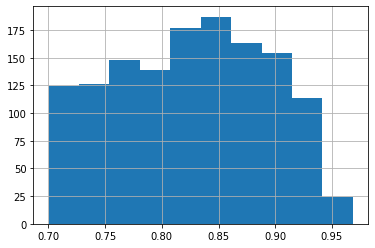

In [20]:
vis_conf['conf'].hist()

In [105]:
vis_conf['category_vote'].value_counts()

form                                      392
monuments                                 274
architectural elements                    196
people                                    188
landscape scenery and natural features    177
interior                                   65
urban scenery                              28
gastronomy                                 28
product                                     8
Name: category_vote, dtype: int64

In [106]:
vis_conf['category_vote'].value_counts()/1356

form                                      0.289086
monuments                                 0.202065
architectural elements                    0.144543
people                                    0.138643
landscape scenery and natural features    0.130531
interior                                  0.047935
urban scenery                             0.020649
gastronomy                                0.020649
product                                   0.005900
Name: category_vote, dtype: float64

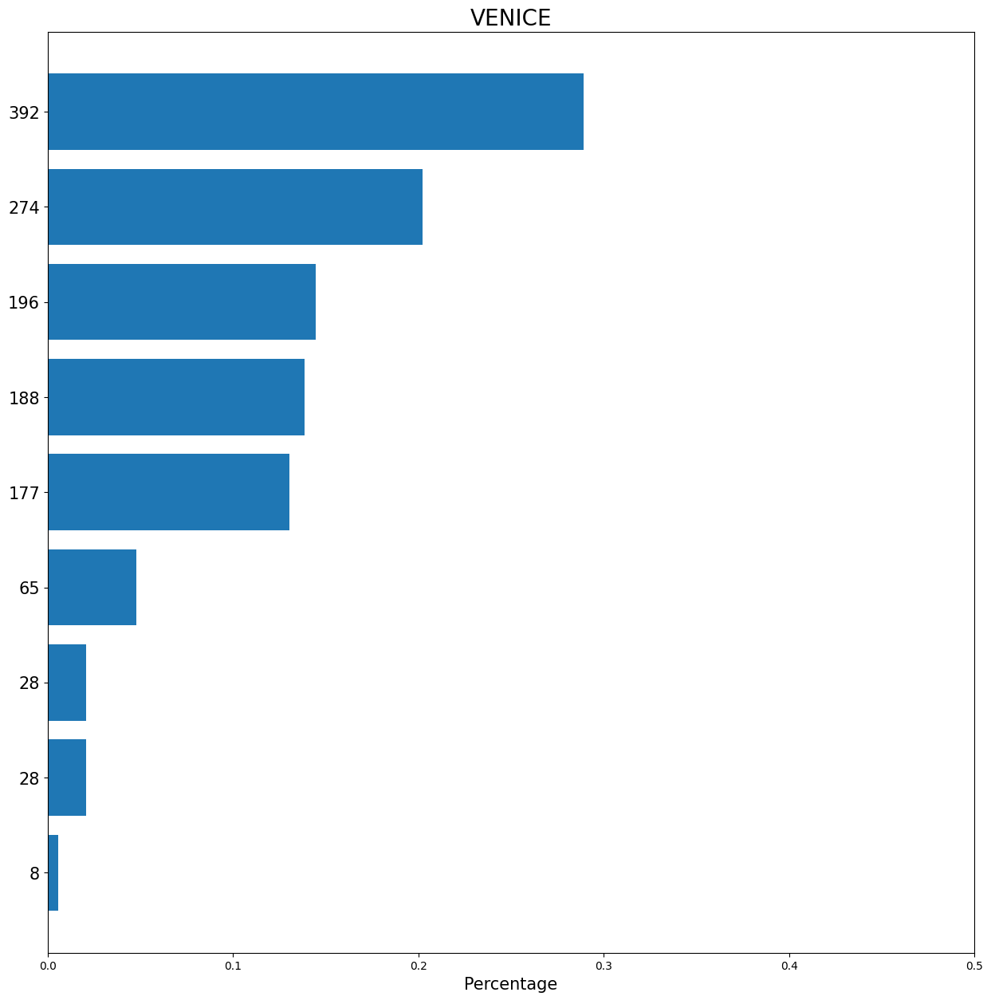

In [107]:
import matplotlib.pyplot as plt
import numpy as np

# Fixing random state for reproducibility
np.random.seed(19680801)


plt.rcdefaults()
fig, ax = plt.subplots(figsize=(15,15))

# Example data
ax.barh(np.arange(9), vis_conf['category_vote'].value_counts()/1356, align='center')
ax.invert_yaxis()  # labels read top-to-bottom
ax.set_yticks(np.arange(9), labels=vis_conf['category_vote'].value_counts(),size=15)
ax.set_xlabel('Percentage',size=15)
ax.set_title('VENICE',size=20)
ax.set_xlim(0,0.5)

plt.show()

In [18]:
cat_new = ['Monuments and Buildings','Building Elements','Urban Form Elements',
           'Urban Scenery','Natural Features and Land-scape Scenery','Interior Scenery',
          'People’s Activity and Association','Gastronomy','Artifact Products']

In [19]:
cat_dict_new = {0: 'Building Elements',
 1: 'Urban Form Elements',
 2: 'Gastronomy',
 3: 'Interior Scenery',
 4: 'Natural Features and Land-scape Scenery',
 5: 'Monuments and Buildings',
 6: 'People’s Activity and Association',
 7: 'Artifact Products',
 8: 'Urban Scenery'}

In [20]:
cat_dict_new

{0: 'Building Elements',
 1: 'Urban Form Elements',
 2: 'Gastronomy',
 3: 'Interior Scenery',
 4: 'Natural Features and Land-scape Scenery',
 5: 'Monuments and Buildings',
 6: 'People’s Activity and Association',
 7: 'Artifact Products',
 8: 'Urban Scenery'}

In [26]:
vis_conf[vis_conf.cat_id_stack==0].iloc[:3]['ID']

737     51394346695
728     51395176128
1721    50580181567
Name: ID, dtype: int64

In [27]:
dict_pic = {}
for i in range(9):
    dict_pic[cat_dict_new[i]] = {}
    temp = vis_conf[vis_conf.cat_id_stack==i].iloc[:5]
    for j in range(5):
        dict_pic[cat_dict_new[i]][temp['ID'].iloc[j]] = temp['conf'].iloc[j]

In [25]:
dict_pic_neg = {}
for i in range(9):
    dict_pic_neg[cat_dict_new[i]] = {}
    temp = vis_neg[vis_neg.cat_id_stack==i].iloc[:3]
    for j in range(3):
        dict_pic_neg[cat_dict_new[i]][temp['ID'].iloc[j]] = temp['conf'].iloc[j]

In [28]:
pics = {}
pics['VEN'] = dict_pic

In [26]:
pics_neg = {}
pics_neg['VEN'] = dict_pic_neg

#### Venezia_Large

In [27]:
vis = pd.read_csv('data_storage/images/IMG_pred_150_cat.csv',sep='\t', index_col='Unnamed: 0')
vis

,ID,Attributes_0,Attributes_1,Attributes_2,Attributes_3,Attributes_4,Attributes_5,Attributes_6,Attributes_7,Attributes_8,...,cat_id_vote,cat_probs_vote,category_vote,conf_vote,cat_id_stack,cat_probs_stack,category_stack,conf_stack,category_same,index.1
0,50770113131,man-made,natural light,no horizon,open area,vertical components,vegetation,sunny,leaves,foliage,...,0,[0.39053658 0.07688859 0.05247085 0.01808068 0...,architectural elements,0.390537,0,[0.434003 0.09930002 0.0074593 0.01666662 0...,architectural elements,0.434003,True,50770113131
1,50770228312,man-made,natural light,open area,vertical components,no horizon,touring,sunny,brick,praying,...,5,[0.25264659 0.02824921 0.00182519 0.00707536 0...,monuments,0.689898,5,[0.36544746 0.03825779 0.00173039 0.00638233 0...,monuments,0.556244,True,50770228312
2,50766039303,natural light,open area,man-made,boating,sunny,swimming,transporting,far-away horizon,still water,...,4,[0.0073182 0.35323225 0.00486117 0.00246835 0...,landscape scenery and natural features,0.477274,1,[0.04836891 0.40009176 0.02311173 0.04185914 0...,form,0.400092,False,50766039303
3,50766893587,natural light,man-made,open area,touring,boating,swimming,sunny,still water,vertical components,...,6,[0.02507305 0.25538455 0.01152419 0.00863368 0...,people,0.481766,6,[0.0181194 0.33873159 0.06019872 0.05836022 0...,people,0.364438,True,50766893587
4,50766892772,man-made,natural light,open area,no horizon,vertical components,sunny,pavement,driving,touring,...,1,[0.01647333 0.89346488 0.01105204 0.00141608 0...,form,0.893465,1,[7.14481079e-03 9.37520564e-01 6.32304290e-03 ...,form,0.937521,True,50766892772
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
80958,20879329608,man-made,natural light,open area,sunny,no horizon,vertical components,touring,brick,glass,...,5,[0.03339911 0.28411171 0.00525297 0.00765534 0...,monuments,0.509671,5,[0.09946484 0.32641971 0.00675882 0.00629108 0...,monuments,0.458628,True,20879329608
80959,21040989736,man-made,no horizon,natural light,aged,vertical components,praying,symmetrical,brick,enclosed area,...,0,[0.94034656 0.01258757 0.00357108 0.01685633 0...,architectural elements,0.940347,0,[9.43930439e-01 7.15241083e-03 3.10525620e-04 ...,architectural elements,0.943930,True,21040989736
80960,20880415099,man-made,no horizon,natural light,aged,rock,open area,dry,sunny,brick,...,0,[0.87164785 0.03271126 0.00088374 0.0227124 0...,architectural elements,0.871648,0,[9.09375858e-01 1.06165719e-02 5.26034688e-04 ...,architectural elements,0.909376,True,20880415099
80961,20879281658,man-made,no horizon,natural light,aged,dry,brick,wood,enclosed area,dirty,...,0,[0.55386971 0.32644859 0.00757863 0.01558469 0...,architectural elements,0.553870,0,[0.6153323 0.179466 0.00454481 0.06058073 0...,architectural elements,0.615332,True,20879281658


In [30]:
vis['conf'] = (vis['conf_vote'] + vis['conf_stack'])/2

In [110]:
vis_conf = vis.sort_values(by = ['conf'], ascending=False)
vis_conf = vis_conf[vis_conf.category_same][vis_conf.conf>0.7]
vis_conf

C:\Users\zzbn1\AppData\Local\Temp\ipykernel_6932\100701580.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  vis_conf = vis_conf[vis_conf.category_same][vis_conf.conf>0.7]


,ID,Attributes_0,Attributes_1,Attributes_2,Attributes_3,Attributes_4,Attributes_5,Attributes_6,Attributes_7,Attributes_8,...,cat_probs_vote,category_vote,conf_vote,cat_id_stack,cat_probs_stack,category_stack,conf_stack,category_same,index.1,conf
49072,22371775288,open area,natural light,man-made,sunny,clouds,far-away horizon,vertical components,touring,dry,...,[2.79787092e-03 1.11814841e-02 2.71177864e-04 ...,urban scenery,0.964001,8,[1.01909776e-03 9.68358354e-03 1.38727845e-03 ...,urban scenery,0.975138,True,22371775288,0.969570
9941,8706835629,open area,natural light,far-away horizon,boating,ocean,swimming,natural,clouds,diving,...,[1.10062610e-03 1.28821884e-03 8.81404079e-04 ...,landscape scenery and natural features,0.986017,4,[8.21077247e-03 5.65623481e-03 3.14246390e-03 ...,landscape scenery and natural features,0.946958,True,8706835629,0.966487
6881,7889943366,open area,far-away horizon,natural light,boating,clouds,ocean,swimming,natural,man-made,...,[4.41343199e-03 4.24878955e-03 4.86353105e-04 ...,landscape scenery and natural features,0.985047,4,[8.32448476e-03 5.83543536e-03 3.15787028e-03 ...,landscape scenery and natural features,0.946651,True,7889943366,0.965849
44408,16408622169,open area,natural light,far-away horizon,boating,swimming,ocean,clouds,diving,natural,...,[1.11688752e-03 2.13840074e-03 9.18812202e-04 ...,landscape scenery and natural features,0.982460,4,[8.26227054e-03 5.85117259e-03 3.22468748e-03 ...,landscape scenery and natural features,0.945893,True,16408622169,0.964176
36719,5767987694,open area,natural light,boating,ocean,far-away horizon,swimming,natural,diving,sunny,...,[1.92122297e-03 3.63623610e-03 3.89044590e-04 ...,landscape scenery and natural features,0.981383,4,[8.31802347e-03 5.92131201e-03 3.24125305e-03 ...,landscape scenery and natural features,0.945433,True,5767987694,0.963408
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1077,50550364352,no horizon,man-made,enclosed area,natural light,horizontal components,shopping,open area,natural,paper,...,[0.70482315 0.01625408 0.0782885 0.04656413 0...,architectural elements,0.704823,0,[0.69524577 0.03390145 0.00592258 0.10290717 0...,architectural elements,0.695246,True,50550364352,0.700034
18527,32859683128,natural light,open area,sunny,boating,man-made,swimming,far-away horizon,diving,ocean,...,[0.0110632 0.11803859 0.00490878 0.00365089 0...,landscape scenery and natural features,0.700423,4,[0.03991681 0.05435161 0.01347775 0.02393754 0...,landscape scenery and natural features,0.699641,True,32859683128,0.700032
20104,35064001260,open area,natural light,man-made,boating,far-away horizon,sunny,clouds,swimming,ocean,...,[0.0605867 0.02640612 0.00475021 0.00569984 0...,landscape scenery and natural features,0.697495,4,[0.06604487 0.03921148 0.01230322 0.02639076 0...,landscape scenery and natural features,0.702564,True,35064001260,0.700029
13559,13938669933,open area,man-made,natural light,boating,touring,vertical components,swimming,sunny,ocean,...,[0.03874794 0.02510814 0.00238834 0.00638011 0...,monuments,0.732201,5,[0.15425999 0.09119208 0.00571582 0.00600509 0...,monuments,0.667833,True,13938669933,0.700017


<AxesSubplot:>

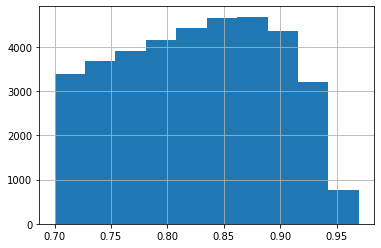

In [32]:
vis_conf['conf'].hist()

In [111]:
vis_conf['category_vote'].value_counts()

form                                      9146
people                                    7680
landscape scenery and natural features    7442
monuments                                 4578
architectural elements                    4242
interior                                  1797
product                                   1284
gastronomy                                 684
urban scenery                              436
Name: category_vote, dtype: int64

In [112]:
vis_conf['category_vote'].value_counts()/37289

form                                      0.245273
people                                    0.205959
landscape scenery and natural features    0.199576
monuments                                 0.122771
architectural elements                    0.113760
interior                                  0.048191
product                                   0.034434
gastronomy                                0.018343
urban scenery                             0.011692
Name: category_vote, dtype: float64

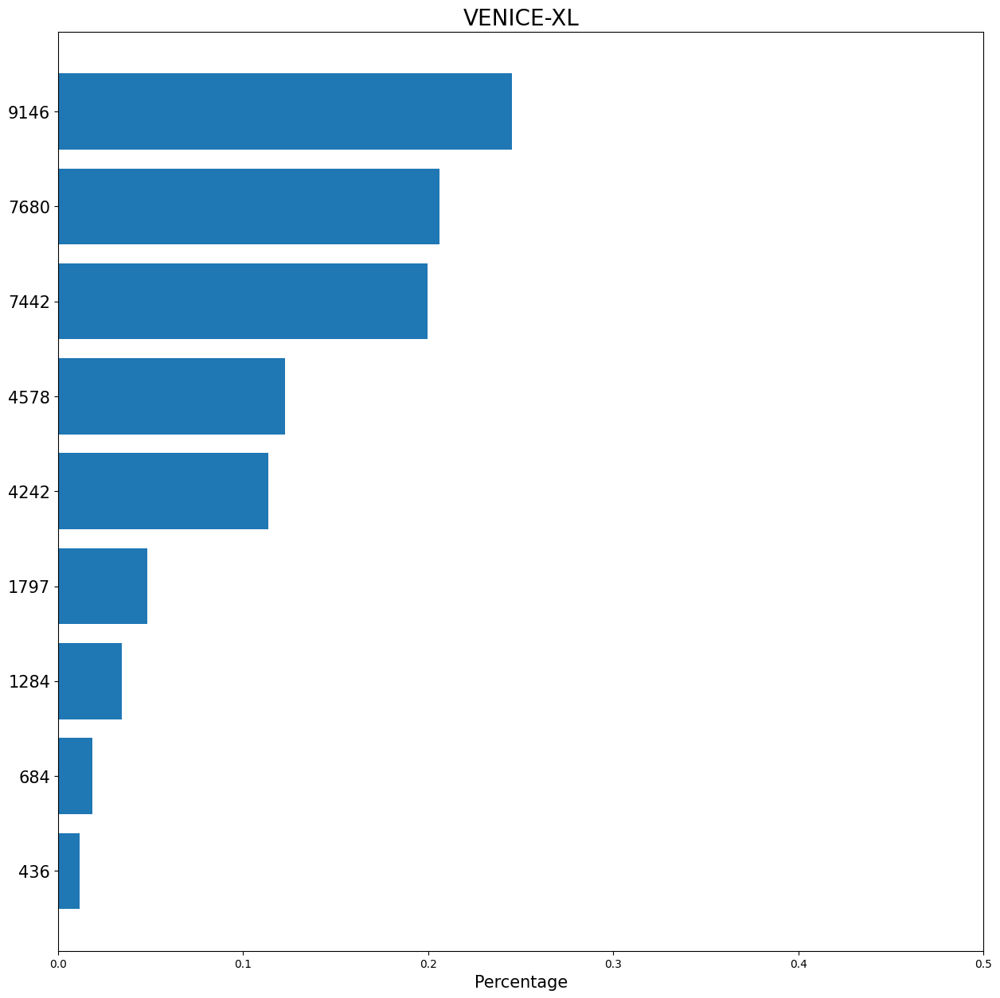

In [113]:
import matplotlib.pyplot as plt
import numpy as np

# Fixing random state for reproducibility
np.random.seed(19680801)


plt.rcdefaults()
fig, ax = plt.subplots(figsize=(15,15))

# Example data
ax.barh(np.arange(9), vis_conf['category_vote'].value_counts()/37289, align='center')
ax.invert_yaxis()  # labels read top-to-bottom
ax.set_yticks(np.arange(9), labels=vis_conf['category_vote'].value_counts(),size=15)
ax.set_xlabel('Percentage',size=15)
ax.set_title('VENICE-XL',size=20)
ax.set_xlim(0,0.5)

plt.show()

In [34]:
dict_pic = {}
for i in range(9):
    dict_pic[cat_dict_new[i]] = {}
    temp = vis_conf[vis_conf.cat_id_stack==i].iloc[:5]
    for j in range(5):
        dict_pic[cat_dict_new[i]][temp['ID'].iloc[j]] = temp['conf'].iloc[j]

In [35]:
pics['VEN_XL'] = dict_pic

In [36]:
pics

{'VEN': {'Building Elements': {51394346695: 0.9385103747592392,
   51395176128: 0.9385103747592392,
   50580181567: 0.9336407667317319,
   51065823576: 0.930494970522448,
   51129441834: 0.9290634392051766},
  'Urban Form Elements': {51107477874: 0.9531783362407105,
   51628113002: 0.9483430078666706,
   51650832649: 0.945744384088017,
   51098021181: 0.9456477397571288,
   51584349246: 0.9450401630112847},
  'Gastronomy': {51406747267: 0.9233874241946238,
   51407764713: 0.9188058101308143,
   50979318316: 0.918559522430582,
   50604093518: 0.8953410721682503,
   51641887038: 0.894424416593659},
  'Interior Scenery': {51650370308: 0.9308188345590755,
   51338729202: 0.9259016224544756,
   51792327515: 0.9228064941199743,
   51794415520: 0.9138501373760086,
   51401400110: 0.9118585532641624},
  'Natural Features and Land-scape Scenery': {51382967864: 0.9547607548259875,
   50247108586: 0.9519027734965254,
   51757192406: 0.9517080678235004,
   51382470348: 0.9515449159045954,
   51733

#### Amsterdam

In [28]:
vis = pd.read_csv('Amsterdam/data_storage/IMG_pred_150_cat.csv',sep='\t', index_col='Unnamed: 0')
vis

,ID,Attributes_0,Attributes_1,Attributes_2,Attributes_3,Attributes_4,Attributes_5,Attributes_6,Attributes_7,Attributes_8,...,name,cat_id_vote,cat_probs_vote,category_vote,conf_vote,cat_id_stack,cat_probs_stack,category_stack,conf_stack,category_same
0,4074991040,man-made,no horizon,natural light,enclosed area,open area,working,transporting,cluttered space,vertical components,...,4074991040.jpg,1,[0.01163006 0.75128504 0.01355577 0.01282714 0...,form,0.751285,1,[0.03152991 0.71872977 0.03105389 0.01366408 0...,form,0.718730,True
1,49286194036,no horizon,cloth,natural light,enclosed area,man-made,working,cold,open area,snow,...,49286194036.jpg,6,[0.01339172 0.01488383 0.10959607 0.00487827 0...,people,0.819626,6,[0.00218615 0.01465237 0.05580986 0.0107194 0...,people,0.875331,True
2,4995005091,man-made,no horizon,natural light,open area,metal,working,enclosed area,transporting,using tools,...,4995005091.jpg,1,[0.01980885 0.71536513 0.0197659 0.00491287 0...,form,0.715365,1,[0.03834073 0.64705265 0.04335567 0.01500726 0...,form,0.647053,True
3,50996941904,no horizon,natural light,man-made,aged,open area,dry,rock,dirt,dirty,...,50996941904.jpg,0,[0.8553286 0.02228096 0.00637996 0.01556115 0...,architectural elements,0.855329,0,[0.88905489 0.01533527 0.0009871 0.03671729 0...,architectural elements,0.889055,True
4,51042706771,no horizon,enclosed area,man-made,cold,snow,sports,competing,exercise,ice,...,51042706771.jpg,6,[0.0961543 0.01962758 0.10259918 0.03581302 0...,people,0.401307,7,[0.05677125 0.04420629 0.15211491 0.04183559 0...,product,0.344768,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3722,5335187703,no horizon,man-made,enclosed area,cloth,working,natural light,glass,shopping,paper,...,5335187703.jpg,6,[1.47485650e-02 2.89907972e-02 5.69431117e-02 ...,people,0.780238,6,[0.00415113 0.02304929 0.05053446 0.02885779 0...,people,0.814394,True
3723,5335187791,man-made,natural light,open area,no horizon,sunny,cloth,transporting,asphalt,driving,...,5335187791.jpg,1,[0.00680566 0.8445374 0.00478105 0.00767735 0...,form,0.844537,1,[0.00947347 0.89609874 0.01439179 0.00495316 0...,form,0.896099,True
3724,5683515939,no horizon,enclosed area,man-made,cloth,working,indoor lighting,socializing,eating,wood,...,5683515939.jpg,6,[0.00702695 0.03434976 0.02083959 0.01055694 0...,people,0.900408,6,[1.08120940e-03 1.02531336e-02 2.20323908e-02 ...,people,0.939081,True
3725,6526596205,man-made,natural light,open area,transporting,sunny,metal,no horizon,aged,driving,...,6526596205.jpg,1,[0.0132306 0.69685098 0.00788178 0.00388907 0...,form,0.696851,1,[0.04320043 0.44450067 0.04688102 0.01879822 0...,form,0.444501,True


In [115]:
vis['conf'] = (vis['conf_vote'] + vis['conf_stack'])/2

In [33]:
vis_neg = vis.sort_values(by = ['conf'], ascending=True)

In [116]:
vis_conf = vis.sort_values(by = ['conf'], ascending=False)
vis_conf = vis_conf[vis_conf.category_same][vis_conf.conf>0.7]
vis_conf

C:\Users\zzbn1\AppData\Local\Temp\ipykernel_6932\100701580.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  vis_conf = vis_conf[vis_conf.category_same][vis_conf.conf>0.7]


,ID,Attributes_0,Attributes_1,Attributes_2,Attributes_3,Attributes_4,Attributes_5,Attributes_6,Attributes_7,Attributes_8,...,cat_id_vote,cat_probs_vote,category_vote,conf_vote,cat_id_stack,cat_probs_stack,category_stack,conf_stack,category_same,conf
1844,51472673966,natural light,open area,man-made,sunny,far-away horizon,vertical components,clouds,dry,horizontal components,...,8,[1.58064103e-03 9.11066052e-03 4.01190567e-04 ...,urban scenery,0.970682,8,[9.54643778e-04 9.25696801e-03 1.31498270e-03 ...,urban scenery,0.976516,True,0.973599
1481,51412765721,man-made,natural light,open area,driving,asphalt,transporting,biking,no horizon,pavement,...,1,[1.93533173e-03 9.50035648e-01 5.04983837e-03 ...,form,0.950036,1,[4.14662110e-03 9.56939061e-01 4.47981280e-03 ...,form,0.956939,True,0.953487
3067,51816944548,open area,natural light,boating,far-away horizon,ocean,swimming,natural,diving,moist,...,4,[3.36862643e-03 4.78882279e-03 7.18282021e-04 ...,landscape scenery and natural features,0.966483,4,[8.83243216e-03 6.49079062e-03 3.61765101e-03 ...,landscape scenery and natural features,0.938978,True,0.952731
735,51352641542,man-made,natural light,open area,driving,asphalt,pavement,biking,no horizon,transporting,...,1,[0.0091071 0.94232161 0.00421884 0.00099999 0...,form,0.942322,1,[4.40187120e-03 9.57970406e-01 4.40597125e-03 ...,form,0.957970,True,0.950146
1475,51411199979,man-made,natural light,open area,driving,asphalt,pavement,biking,no horizon,transporting,...,1,[0.0091071 0.94232161 0.00421884 0.00099999 0...,form,0.942322,1,[4.40187120e-03 9.57970406e-01 4.40597125e-03 ...,form,0.957970,True,0.950146
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
130,51218305964,no horizon,man-made,enclosed area,metal,glass,horizontal components,vertical components,railing,wire,...,0,[0.71817814 0.07034517 0.01225332 0.06582222 0...,architectural elements,0.718178,0,[0.68305886 0.05164015 0.00277017 0.09596594 0...,architectural elements,0.683059,True,0.700619
970,51367663783,natural light,open area,man-made,cloth,sunny,touring,clouds,socializing,warm,...,1,[0.01764827 0.64800871 0.00856236 0.00617696 0...,form,0.648009,1,[0.01471472 0.75297236 0.02966108 0.01379882 0...,form,0.752972,True,0.700491
133,51218306789,enclosed area,no horizon,indoor lighting,man-made,cloth,glossy,socializing,wood,congregating,...,3,[0.02187715 0.10638508 0.04797077 0.62778358 0...,interior,0.627784,3,[0.06527872 0.07257043 0.01425023 0.77308459 0...,interior,0.773085,True,0.700434
2533,51665884150,open area,man-made,natural light,grass,sunny,no horizon,playing,vegetation,cloth,...,1,[0.02004092 0.72012499 0.01222996 0.00532101 0...,form,0.720125,1,[0.03097247 0.68025996 0.03195769 0.01286388 0...,form,0.680260,True,0.700192


<AxesSubplot:>

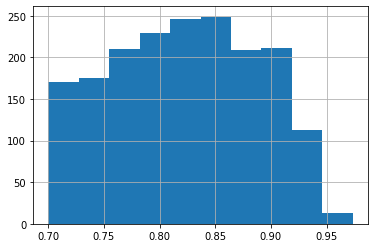

In [40]:
vis_conf['conf'].hist()

In [117]:
vis_conf['category_vote'].value_counts()

form                                      775
people                                    568
landscape scenery and natural features    149
architectural elements                    111
monuments                                  66
interior                                   61
gastronomy                                 53
product                                    31
urban scenery                              11
Name: category_vote, dtype: int64

In [118]:
vis_conf['category_vote'].value_counts()/1825

form                                      0.424658
people                                    0.311233
landscape scenery and natural features    0.081644
architectural elements                    0.060822
monuments                                 0.036164
interior                                  0.033425
gastronomy                                0.029041
product                                   0.016986
urban scenery                             0.006027
Name: category_vote, dtype: float64

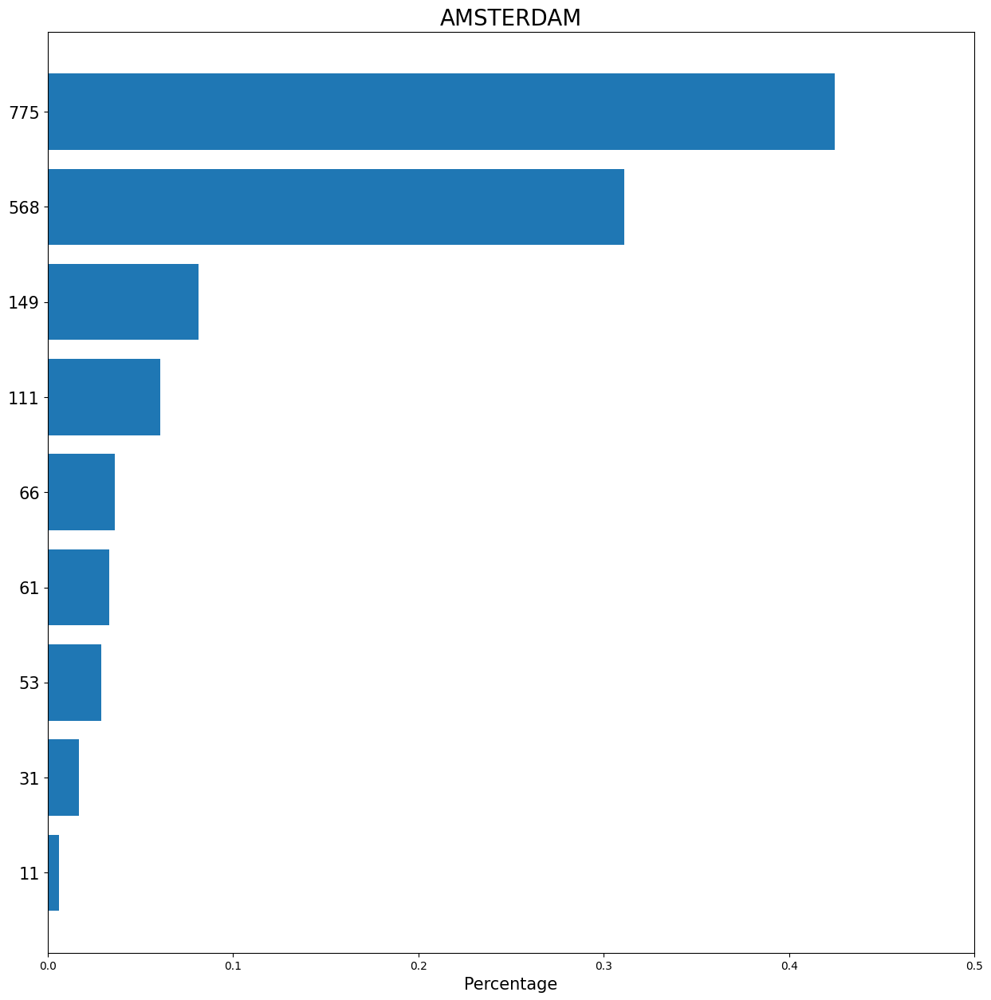

In [120]:
import matplotlib.pyplot as plt
import numpy as np

# Fixing random state for reproducibility
np.random.seed(19680801)


plt.rcdefaults()
fig, ax = plt.subplots(figsize=(15,15))

# Example data
ax.barh(np.arange(9), vis_conf['category_vote'].value_counts()/1825, align='center')
ax.invert_yaxis()  # labels read top-to-bottom
ax.set_yticks(np.arange(9), labels=vis_conf['category_vote'].value_counts(),size=15)
ax.set_xlabel('Percentage',size=15)
ax.set_title('AMSTERDAM',size=20)
ax.set_xlim(0,0.5)

plt.show()

In [42]:
dict_pic = {}
for i in range(9):
    dict_pic[cat_dict_new[i]] = {}
    temp = vis_conf[vis_conf.cat_id_stack==i].iloc[:5]
    for j in range(5):
        dict_pic[cat_dict_new[i]][temp['ID'].iloc[j]] = temp['conf'].iloc[j]

In [34]:
dict_pic_neg = {}
for i in range(9):
    dict_pic_neg[cat_dict_new[i]] = {}
    temp = vis_neg[vis_neg.cat_id_stack==i].iloc[:3]
    for j in range(3):
        dict_pic_neg[cat_dict_new[i]][temp['ID'].iloc[j]] = temp['conf'].iloc[j]

In [35]:
pics_neg['AMS'] = dict_pic_neg

In [43]:
pics['AMS'] = dict_pic

In [44]:
pics

{'VEN': {'Building Elements': {51394346695: 0.9385103747592392,
   51395176128: 0.9385103747592392,
   50580181567: 0.9336407667317319,
   51065823576: 0.930494970522448,
   51129441834: 0.9290634392051766},
  'Urban Form Elements': {51107477874: 0.9531783362407105,
   51628113002: 0.9483430078666706,
   51650832649: 0.945744384088017,
   51098021181: 0.9456477397571288,
   51584349246: 0.9450401630112847},
  'Gastronomy': {51406747267: 0.9233874241946238,
   51407764713: 0.9188058101308143,
   50979318316: 0.918559522430582,
   50604093518: 0.8953410721682503,
   51641887038: 0.894424416593659},
  'Interior Scenery': {51650370308: 0.9308188345590755,
   51338729202: 0.9259016224544756,
   51792327515: 0.9228064941199743,
   51794415520: 0.9138501373760086,
   51401400110: 0.9118585532641624},
  'Natural Features and Land-scape Scenery': {51382967864: 0.9547607548259875,
   50247108586: 0.9519027734965254,
   51757192406: 0.9517080678235004,
   51382470348: 0.9515449159045954,
   51733

#### Suzhou

In [36]:
vis = pd.read_csv('Suzhou/data_storage/IMG_pred_150_cat.csv',sep='\t', index_col='Unnamed: 0')
vis

,ID,Attributes_0,Attributes_1,Attributes_2,Attributes_3,Attributes_4,Attributes_5,Attributes_6,Attributes_7,Attributes_8,...,name,cat_id_vote,cat_probs_vote,category_vote,conf_vote,cat_id_stack,cat_probs_stack,category_stack,conf_stack,category_same
0,23903381607,man-made,no horizon,enclosed area,wood,congregating,indoor lighting,socializing,glass,reading,...,23903381607.jpg,3,[0.03062912 0.06984577 0.01363846 0.70257875 0...,interior,0.702579,3,[0.04236902 0.0428085 0.0061926 0.86693228 0...,interior,0.866932,True
1,23903645987,no horizon,natural light,man-made,trees,foliage,leaves,vegetation,open area,shrubbery,...,23903645987.jpg,1,[0.03874995 0.68095126 0.025399 0.02760094 0...,form,0.680951,1,[0.04245123 0.57021507 0.05565661 0.01998769 0...,form,0.570215,True
2,23919231927,natural light,foliage,vegetation,leaves,open area,trees,no horizon,natural,shrubbery,...,23919231927.jpg,4,[0.08737925 0.25094049 0.02948376 0.0146598 0...,landscape scenery and natural features,0.502708,1,[0.05993176 0.46013654 0.02886411 0.03034439 0...,form,0.460137,False
3,23940920237,no horizon,man-made,enclosed area,indoor lighting,vertical components,wood,metal,glossy,horizontal components,...,23940920237.jpg,0,[0.34380807 0.21458918 0.01576329 0.22942173 0...,architectural elements,0.343808,1,[0.14300017 0.38732122 0.01060502 0.1477839 0...,form,0.387321,False
4,23952125997,no horizon,enclosed area,man-made,wood,glass,indoor lighting,glossy,reading,matte,...,23952125997.jpg,3,[0.05514696 0.01903631 0.01648106 0.76124506 0...,interior,0.761245,3,[0.03329314 0.01542674 0.00315353 0.9232714 0...,interior,0.923271,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3132,51859424958,natural light,open area,man-made,sunny,still water,far-away horizon,boating,swimming,clouds,...,51859424958.jpg,5,[0.24162173 0.03171413 0.00606352 0.00762327 0...,monuments,0.472731,5,[0.29078886 0.12592688 0.00877033 0.02226251 0...,monuments,0.417480,True
3133,51859673444,natural light,man-made,open area,foliage,leaves,trees,vegetation,no horizon,horizontal components,...,51859673444.jpg,1,[0.16961032 0.65588096 0.01111492 0.01100892 0...,form,0.655881,1,[0.14773017 0.61270415 0.02143536 0.02761044 0...,form,0.612704,True
3134,51859675789,natural light,open area,trees,man-made,foliage,leaves,vegetation,no horizon,natural,...,51859675789.jpg,0,[0.49592087 0.24359059 0.00974954 0.01404292 0...,architectural elements,0.495921,1,[0.2455187 0.37460486 0.00917925 0.05286921 0...,form,0.374605,False
3135,51859999785,natural light,open area,man-made,trees,foliage,leaves,boating,still water,vegetation,...,51859999785.jpg,1,[0.09695909 0.4047241 0.0042215 0.00547551 0...,form,0.404724,1,[0.03239067 0.70291253 0.0155343 0.01290575 0...,form,0.702913,True


In [37]:
vis['conf'] = (vis['conf_vote'] + vis['conf_stack'])/2

In [38]:
vis_neg = vis.sort_values(by = ['conf'], ascending=True)

In [123]:
vis_conf = vis.sort_values(by = ['conf'], ascending=False)
vis_conf = vis_conf[vis_conf.category_same][vis_conf.conf>0.7]
vis_conf

C:\Users\zzbn1\AppData\Local\Temp\ipykernel_6932\100701580.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  vis_conf = vis_conf[vis_conf.category_same][vis_conf.conf>0.7]


,ID,Attributes_0,Attributes_1,Attributes_2,Attributes_3,Attributes_4,Attributes_5,Attributes_6,Attributes_7,Attributes_8,...,cat_id_vote,cat_probs_vote,category_vote,conf_vote,cat_id_stack,cat_probs_stack,category_stack,conf_stack,category_same,conf
998,38618117532,open area,natural light,far-away horizon,boating,ocean,clouds,swimming,natural,moist,...,4,[2.03377369e-03 7.84701312e-03 1.34109577e-03 ...,landscape scenery and natural features,0.966158,4,[0.00888926 0.00656654 0.00361123 0.00512409 0...,landscape scenery and natural features,0.939265,True,0.952712
2069,46601791901,open area,natural light,far-away horizon,clouds,boating,natural,ocean,swimming,moist,...,4,[0.00825238 0.0042886 0.00097608 0.00403995 0...,landscape scenery and natural features,0.964377,4,[9.28850943e-03 6.60924954e-03 3.55400478e-03 ...,landscape scenery and natural features,0.940018,True,0.952198
2700,49759935536,man-made,natural light,no horizon,open area,pavement,aged,driving,asphalt,biking,...,1,[1.15553221e-02 9.43298423e-01 5.06262504e-03 ...,form,0.943298,1,[4.42880624e-03 9.56543353e-01 4.49239299e-03 ...,form,0.956543,True,0.949921
1406,41574328542,man-made,natural light,open area,sunny,driving,pavement,biking,asphalt,vertical components,...,1,[7.35685050e-03 9.35378418e-01 3.21671466e-03 ...,form,0.935378,1,[4.67852856e-03 9.54410214e-01 4.53067837e-03 ...,form,0.954410,True,0.944894
941,38423738216,man-made,no horizon,natural light,trees,open area,foliage,leaves,vegetation,pavement,...,1,[0.01106953 0.92828711 0.004949 0.00775128 0...,form,0.928287,1,[4.92161111e-03 9.52479546e-01 4.92610482e-03 ...,form,0.952480,True,0.940383
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2785,50150105926,no horizon,enclosed area,man-made,matte,dry,working,indoor lighting,shopping,wood,...,2,[0.02618617 0.01437229 0.69323022 0.01570664 0...,gastronomy,0.693230,2,[0.00823136 0.01317047 0.70775216 0.00519326 0...,gastronomy,0.707752,True,0.700491
3110,51849949175,no horizon,natural light,man-made,open area,enclosed area,cold,natural,snow,rugged scene,...,6,[0.05559587 0.0958731 0.02418967 0.02843385 0...,people,0.666311,6,[0.01177959 0.07161913 0.05249364 0.03054941 0...,people,0.734160,True,0.700235
1762,44142898150,natural light,open area,no horizon,man-made,vegetation,foliage,leaves,trees,sunny,...,6,[0.02660596 0.08911193 0.02306321 0.00628149 0...,people,0.664371,6,[0.01397107 0.07655206 0.04532695 0.03706204 0...,people,0.736018,True,0.700194
1325,40674406163,man-made,open area,natural light,no horizon,indoor lighting,vertical components,clouds,transporting,glossy,...,1,[0.05774549 0.71893402 0.00785026 0.01192268 0...,form,0.718934,1,[0.05635004 0.68144966 0.03474398 0.02081288 0...,form,0.681450,True,0.700192


<AxesSubplot:>

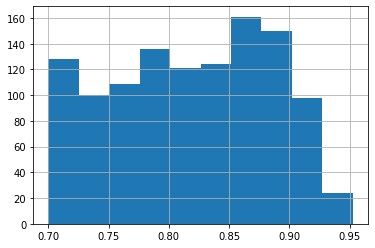

In [48]:
vis_conf['conf'].hist()

In [124]:
vis_conf['category_vote'].value_counts()

form                                      399
gastronomy                                287
people                                    247
architectural elements                     68
landscape scenery and natural features     58
interior                                   46
urban scenery                              23
monuments                                  12
product                                    11
Name: category_vote, dtype: int64

In [125]:
vis_conf['category_vote'].value_counts()/1151

form                                      0.346655
gastronomy                                0.249348
people                                    0.214596
architectural elements                    0.059079
landscape scenery and natural features    0.050391
interior                                  0.039965
urban scenery                             0.019983
monuments                                 0.010426
product                                   0.009557
Name: category_vote, dtype: float64

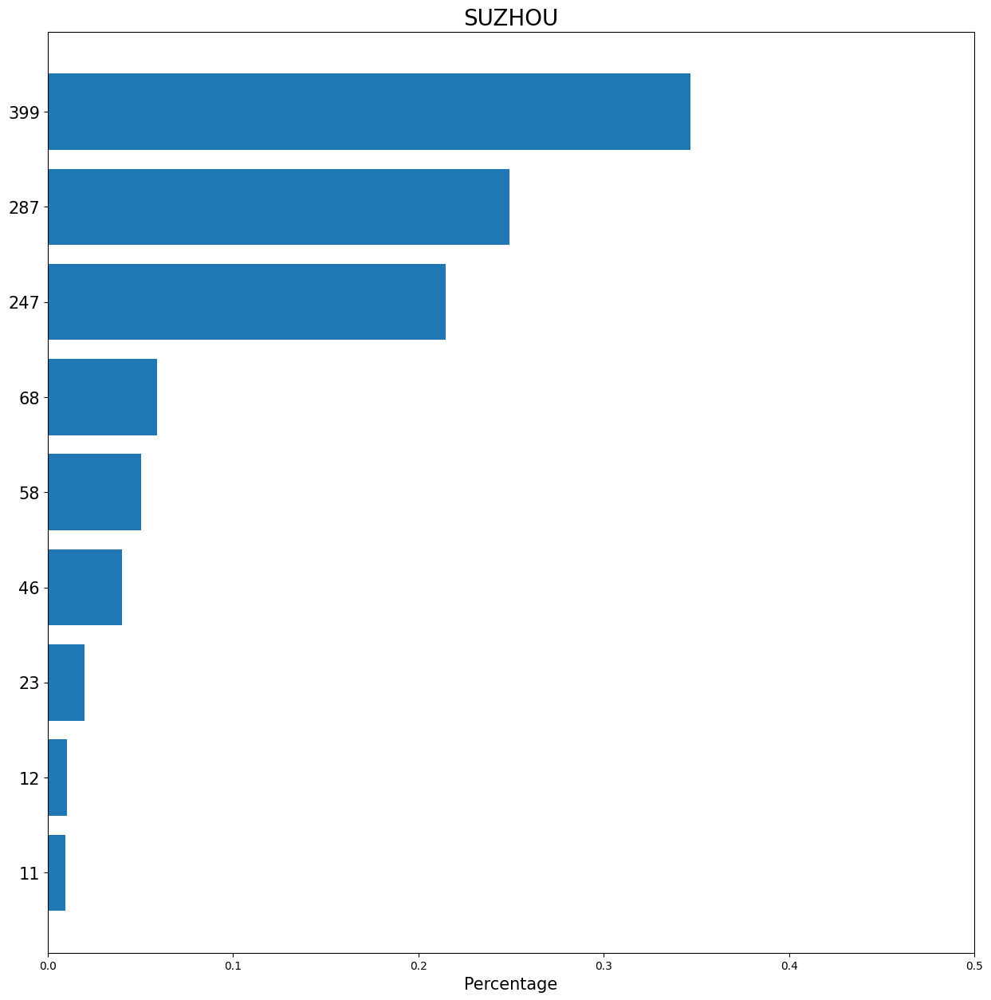

In [126]:
import matplotlib.pyplot as plt
import numpy as np

# Fixing random state for reproducibility
np.random.seed(19680801)


plt.rcdefaults()
fig, ax = plt.subplots(figsize=(15,15))

# Example data
ax.barh(np.arange(9), vis_conf['category_vote'].value_counts()/1151, align='center')
ax.invert_yaxis()  # labels read top-to-bottom
ax.set_yticks(np.arange(9), labels=vis_conf['category_vote'].value_counts(),size=15)
ax.set_xlabel('Percentage',size=15)
ax.set_title('SUZHOU',size=20)
ax.set_xlim(0,0.5)

plt.show()

In [50]:
dict_pic = {}
for i in range(9):
    dict_pic[cat_dict_new[i]] = {}
    temp = vis_conf[vis_conf.cat_id_stack==i].iloc[:5]
    for j in range(5):
        dict_pic[cat_dict_new[i]][temp['ID'].iloc[j]] = temp['conf'].iloc[j]

In [51]:
pics['SUZ'] = dict_pic

In [39]:
dict_pic_neg = {}
for i in range(9):
    dict_pic_neg[cat_dict_new[i]] = {}
    temp = vis_neg[vis_neg.cat_id_stack==i].iloc[:3]
    for j in range(3):
        dict_pic_neg[cat_dict_new[i]][temp['ID'].iloc[j]] = temp['conf'].iloc[j]

In [40]:
pics_neg['SUZ'] = dict_pic_neg

In [52]:
pics

{'VEN': {'Building Elements': {51394346695: 0.9385103747592392,
   51395176128: 0.9385103747592392,
   50580181567: 0.9336407667317319,
   51065823576: 0.930494970522448,
   51129441834: 0.9290634392051766},
  'Urban Form Elements': {51107477874: 0.9531783362407105,
   51628113002: 0.9483430078666706,
   51650832649: 0.945744384088017,
   51098021181: 0.9456477397571288,
   51584349246: 0.9450401630112847},
  'Gastronomy': {51406747267: 0.9233874241946238,
   51407764713: 0.9188058101308143,
   50979318316: 0.918559522430582,
   50604093518: 0.8953410721682503,
   51641887038: 0.894424416593659},
  'Interior Scenery': {51650370308: 0.9308188345590755,
   51338729202: 0.9259016224544756,
   51792327515: 0.9228064941199743,
   51794415520: 0.9138501373760086,
   51401400110: 0.9118585532641624},
  'Natural Features and Land-scape Scenery': {51382967864: 0.9547607548259875,
   50247108586: 0.9519027734965254,
   51757192406: 0.9517080678235004,
   51382470348: 0.9515449159045954,
   51733

In [41]:
pics_neg

{'VEN': {'Building Elements': {50694229011: 0.24368277005761899,
   51334755382: 0.26896679442139354,
   50694310517: 0.2721974833854521},
  'Urban Form Elements': {50670695908: 0.26601887318659345,
   51630760781: 0.267285804810375,
   51338713997: 0.2741120243614475},
  'Gastronomy': {51530545544: 0.3040552795730094,
   51628095926: 0.3283299922652143,
   51677867202: 0.36423938821398655},
  'Interior Scenery': {51234303470: 0.248467019293111,
   50694229376: 0.3225894917858567,
   51666062108: 0.3263211597146985},
  'Natural Features and Land-scape Scenery': {51655337748: 0.31033745430411136,
   51632422352: 0.3511026832447345,
   51337279057: 0.3519197030663393},
  'Monuments and Buildings': {50645892777: 0.25617296183751725,
   51666708125: 0.2817082818967448,
   51334763297: 0.30208152206077765},
  'People’s Activity and Association': {51335680873: 0.261573484587429,
   50459500487: 0.26454453132305494,
   50241329903: 0.27306730339270446},
  'Artifact Products': {50611933998: 0.

In [61]:
reform = {(outerKey, innerKey): values.keys() for outerKey, innerDict in pics.items() for innerKey, values in innerDict.items()}

In [42]:
reform_neg = {(outerKey, innerKey): values.keys() for outerKey, innerDict in pics_neg.items() for innerKey, values in innerDict.items()}

In [43]:
pics_neg_df = pd.DataFrame(reform_neg).T

In [44]:
pics_neg_df

0            1  \
VEN Building Elements                        50694229011  51334755382   
    Urban Form Elements                      50670695908  51630760781   
    Gastronomy                               51530545544  51628095926   
    Interior Scenery                         51234303470  50694229376   
    Natural Features and Land-scape Scenery  51655337748  51632422352   
    Monuments and Buildings                  50645892777  51666708125   
    People’s Activity and Association        51335680873  50459500487   
    Artifact Products                        50611933998  51601121527   
    Urban Scenery                            51838979542  51396649786   
AMS Building Elements                        51416921060  51339354672   
    Urban Form Elements                      51340425629  51847071387   
    Gastronomy                               51280238129  51355541471   
    Interior Scenery                         51340714739  51839083028   
    Natural Features and Land-scape Scenery  51340695450  51340676405   
    Monuments and Buildings                  51848439794  51372813262   
    People’s Activity and Association        51357707430  51334287008   
    Artifact Products                        51283412376  51660458822   
    Urban Scenery                            51478683620  51621094682   
SUZ Building Elements                        37930458805  38783776261   
    Urban Form Elements                      25168694738  49173121901   
    Gastronomy                               38649236424  44523423780   
    Interior Scenery                         28436885859  51161469850   
    Natural Features and Land-scape Scenery  47941330383  44628583501   
    Monuments and Buildings                  49176983556  40264290383   
    People’s Activity and Association        50149572073  27988625198   
    Artifact Products                        38170578364  51848313872   
    Urban Scenery                            49417357386  37897601985   

                                                       2  
VEN Building Elements                        50694310517  
    Urban Form Elements                      51338713997  
    Gastronomy                               51677867202  
    Interior Scenery                         51666062108  
    Natural Features and Land-scape Scenery  51337279057  
    Monuments and Buildings                  51334763297  
    People’s Activity and Association        50241329903  
    Artifact Products                        51629163508  
    Urban Scenery                            50443443043  
AMS Building Elements                        51341067795  
    Urban Form Elements                      51340858424  
    Gastronomy                               51581599498  
    Interior Scenery                         51502199571  
    Natural Features and Land-scape Scenery  51340412474  
    Monuments and Buildings                  51578076810  
    People’s Activity and Association        51340338358  
    Artifact Products                        51421010604  
    Urban Scenery                            51816687206  
SUZ Building Elements                        38479517301  
    Urban Form Elements                      51160580583  
    Gastronomy                               31502928617  
    Interior Scenery                         50149556178  
    Natural Features and Land-scape Scenery  43929580544  
    Monuments and Buildings                  32468287018  
    People’s Activity and Association        24024043897  
    Artifact Products                        49172652143  
    Urban Scenery                            49615612013

In [65]:
pics_df = pd.DataFrame(reform).T
pics_df

0            1  \
VEN    Building Elements                        51394346695  51395176128   
       Urban Form Elements                      51107477874  51628113002   
       Gastronomy                               51406747267  51407764713   
       Interior Scenery                         51650370308  51338729202   
       Natural Features and Land-scape Scenery  51382967864  50247108586   
       Monuments and Buildings                  51844683522  50245138422   
       People’s Activity and Association        51841876448  51394120947   
       Artifact Products                        51666511849  51757433843   
       Urban Scenery                            51410921124  51530072223   
VEN_XL Building Elements                        49398623593  49399714722   
       Urban Form Elements                      48818474838  35858514453   
       Gastronomy                               50070099517  38297925841   
       Interior Scenery                         22539443615  42141884514   
       Natural Features and Land-scape Scenery   8706835629   7889943366   
       Monuments and Buildings                  17127233550  48804702872   
       People’s Activity and Association         2680702939  46717655741   
       Artifact Products                        49818384136  48266209292   
       Urban Scenery                            22371775288   6165669744   
AMS    Building Elements                        51847096132  51865546851   
       Urban Form Elements                      51412765721  51352641542   
       Gastronomy                               51283892109  51373458507   
       Interior Scenery                         51218305649  51339260822   
       Natural Features and Land-scape Scenery  51816944548  51838136978   
       Monuments and Buildings                  51855094277  51218619570   
       People’s Activity and Association        51478880574  51634529586   
       Artifact Products                        51357437039  51340549349   
       Urban Scenery                            51472673966  51387448934   
SUZ    Building Elements                        44707174955  51161445435   
       Urban Form Elements                      49759935536  41574328542   
       Gastronomy                               33038881788  33038881258   
       Interior Scenery                         30678198877  39040150951   
       Natural Features and Land-scape Scenery  38618117532  46601791901   
       Monuments and Buildings                  41654444871  38618112322   
       People’s Activity and Association        41663120501  38752995072   
       Artifact Products                        50149557143  44142903660   
       Urban Scenery                            27580288489  38054151875   

                                                          2            3  \
VEN    Building Elements                        50580181567  51065823576   
       Urban Form Elements                      51650832649  51098021181   
       Gastronomy                               50979318316  50604093518   
       Interior Scenery                         51792327515  51794415520   
       Natural Features and Land-scape Scenery  51757192406  51382470348   
       Monuments and Buildings                  51772151087  51351632004   
       People’s Activity and Association        51394045239  51645361290   
       Artifact Products                        51537877938  50915247542   
       Urban Scenery                            51411140275  51870084335   
VEN_XL Building Elements                        39880575545   5613084725   
       Urban Form Elements                      13040849293  25803990735   
       Gastronomy                               45670224832  23088883922   
       Interior Scenery                         11817051025  41565650665   
       Natural Features and Land-scape Scenery  16408622169   5767987694   
       Monuments and Buildings                  19384499168  24426630518   
       People’s Activity and 

In [66]:
pics_df.to_csv('data_storage/images/pics.csv',sep='\t')

In [112]:
list(pics['VEN']['Building Elements'].keys())

[51394346695, 51395176128, 50580181567, 51065823576, 51221534332]

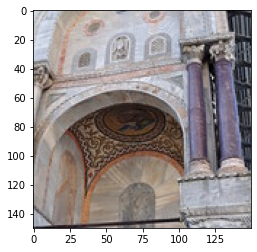

In [119]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
plt.imshow(img)

In [120]:
cat_new

['Monuments and Buildings',
 'Building Elements',
 'Urban Form Elements',
 'Urban Scenery',
 'Natural Features and Land-scape Scenery',
 'Interior Scenery',
 'People’s Activity and Association',
 'Gastronomy',
 'Artifact Products']

VEN,Monuments and Buildings


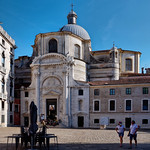

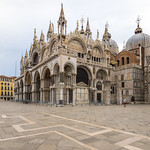

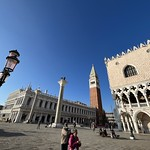

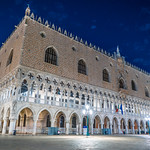

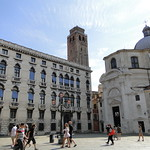

VEN,Building Elements


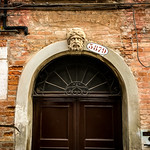

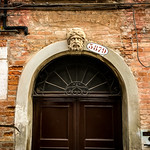

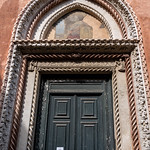

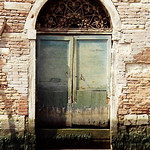

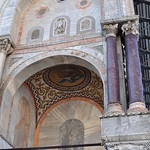

VEN,Urban Form Elements


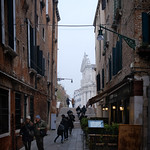

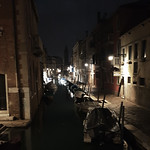

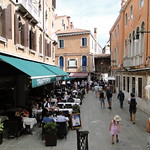

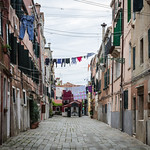

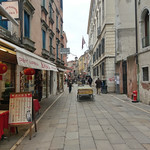

VEN,Urban Scenery


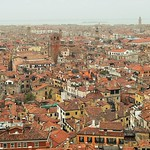

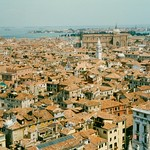

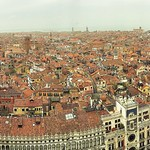

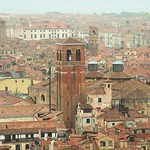

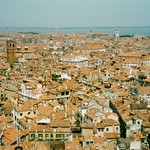

VEN,Natural Features and Land-scape Scenery


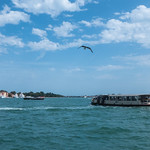

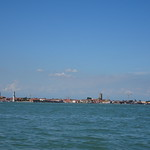

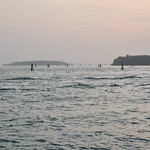

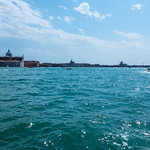

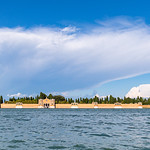

VEN,Interior Scenery


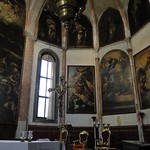

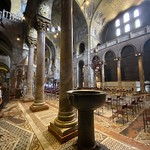

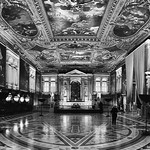

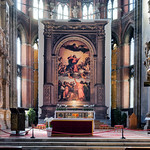

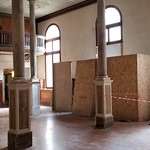

VEN,People’s Activity and Association


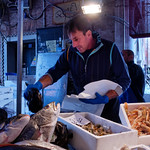

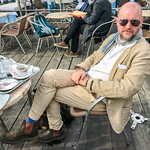

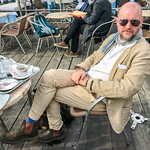

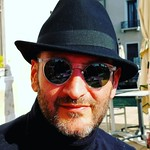

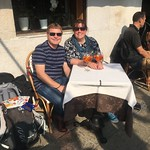

VEN,Gastronomy


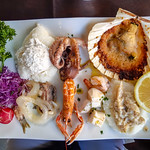

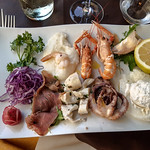

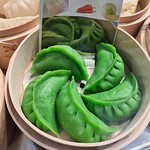

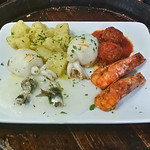

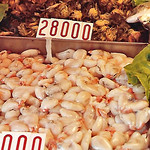

VEN,Artifact Products


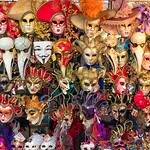

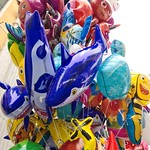

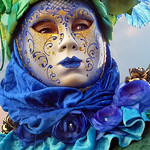

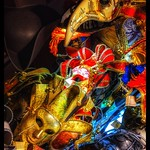

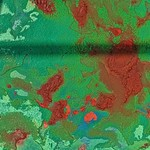

In [67]:
places='VEN'
for types in cat_new:
    print('{},{}'.format(places,types))
    for name in list(pics[places][types].keys()):
        img, input_img = get_one_image_name(str(name), all_images=all_images_150, images_folder=images_folder_150)
        display(img)

VEN,Monuments and Buildings


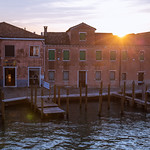

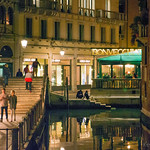

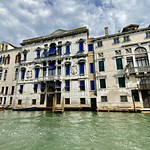

VEN,Building Elements


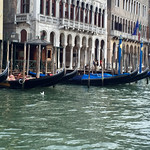

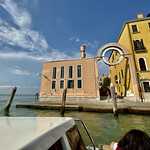

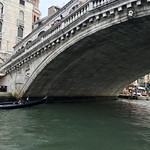

VEN,Urban Form Elements


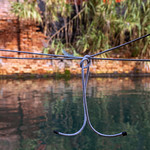

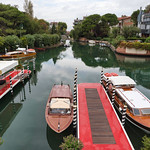

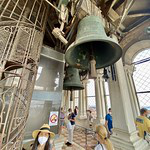

VEN,Urban Scenery


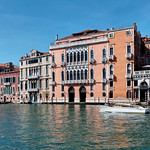

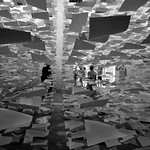

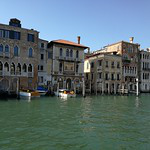

VEN,Natural Features and Land-scape Scenery


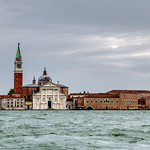

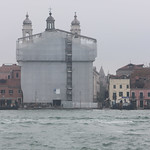

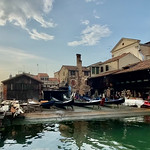

VEN,Interior Scenery


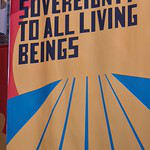

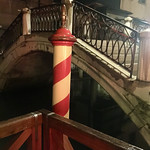

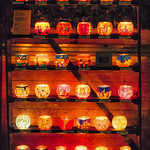

VEN,People’s Activity and Association


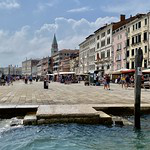

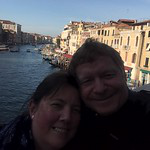

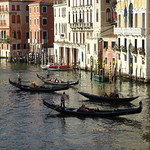

VEN,Gastronomy


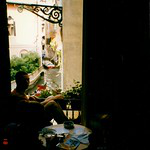

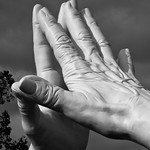

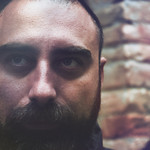

VEN,Artifact Products


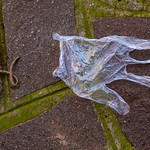

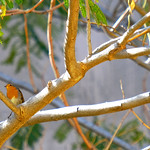

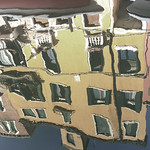

In [45]:
places='VEN'
for types in cat_new:
    print('{},{}'.format(places,types))
    for name in list(pics_neg[places][types].keys()):
        img, input_img = get_one_image_name(str(name), all_images=all_images_150, images_folder=images_folder_150)
        display(img)

AMS,Monuments and Buildings


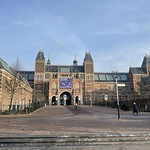

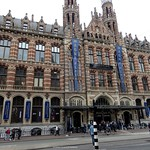

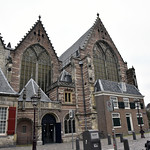

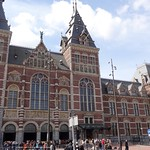

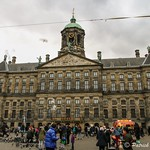

AMS,Building Elements


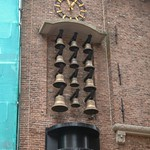

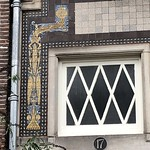

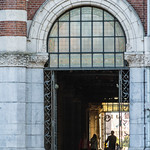

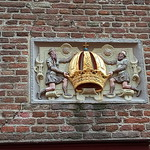

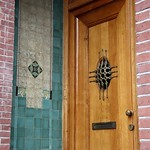

AMS,Urban Form Elements


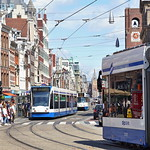

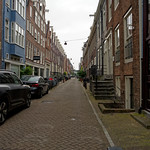

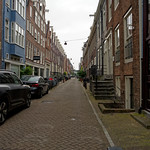

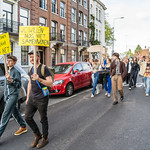

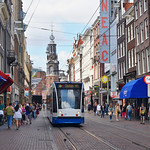

AMS,Urban Scenery


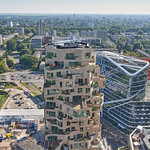

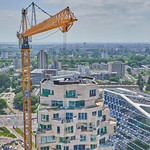

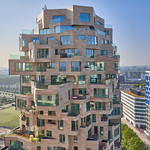

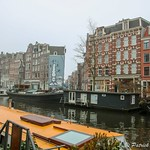

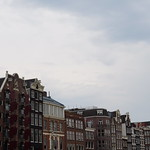

AMS,Natural Features and Land-scape Scenery


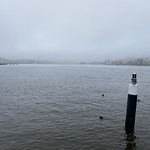

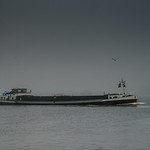

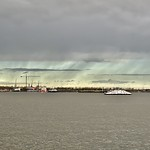

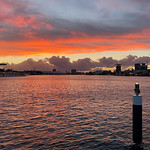

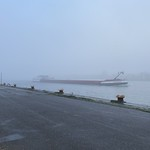

AMS,Interior Scenery


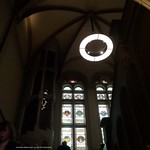

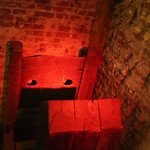

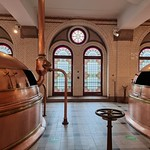

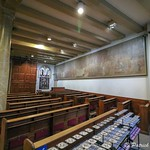

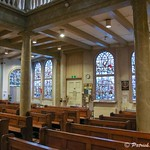

AMS,People’s Activity and Association


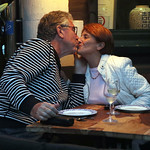

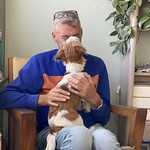

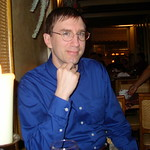

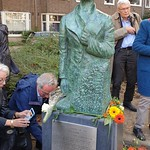

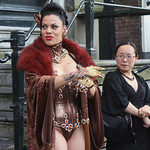

AMS,Gastronomy


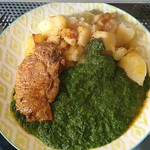

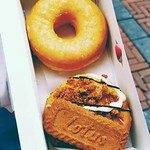

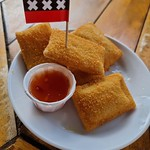

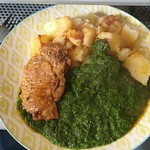

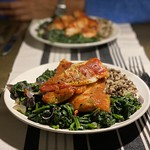

AMS,Artifact Products


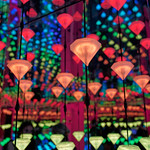

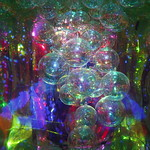

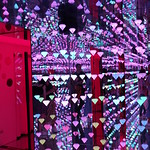

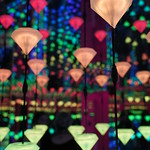

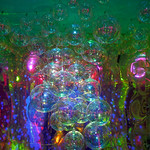

In [68]:
places='AMS'
for types in cat_new:
    print('{},{}'.format(places,types))
    for name in list(pics[places][types].keys()):
        img, input_img = get_one_image_name(str(name), all_images=all_images_150_A, images_folder=images_folder_150_A)
        display(img)

AMS,Monuments and Buildings


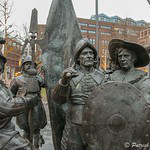

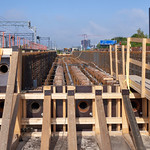

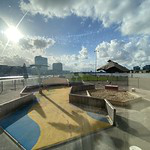

AMS,Building Elements


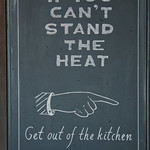

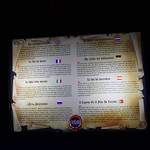

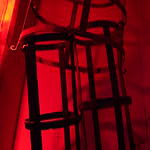

AMS,Urban Form Elements


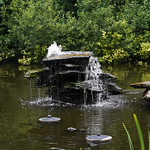

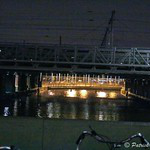

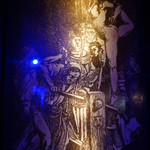

AMS,Urban Scenery


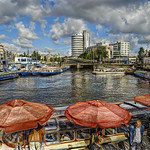

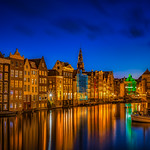

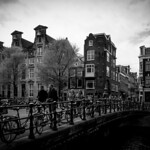

AMS,Natural Features and Land-scape Scenery


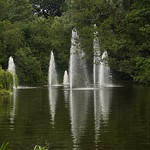

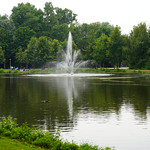

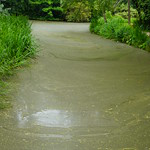

AMS,Interior Scenery


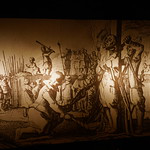

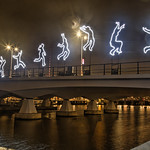

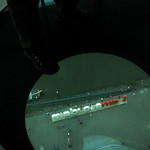

AMS,People’s Activity and Association


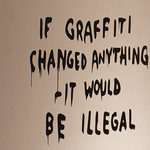

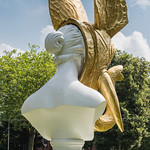

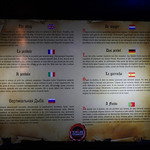

AMS,Gastronomy


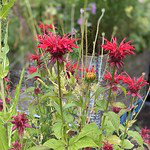

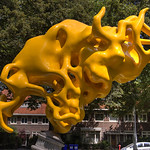

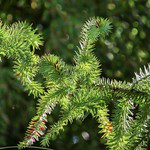

AMS,Artifact Products


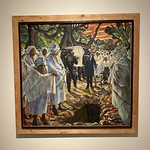

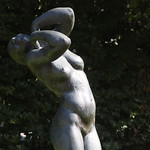

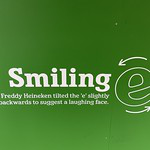

In [46]:
places='AMS'
for types in cat_new:
    print('{},{}'.format(places,types))
    for name in list(pics_neg[places][types].keys()):
        img, input_img = get_one_image_name(str(name), all_images=all_images_150_A, images_folder=images_folder_150_A)
        display(img)

SUZ,Monuments and Buildings


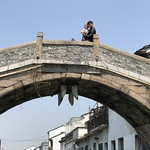

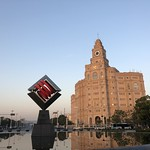

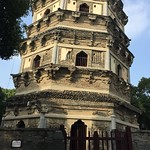

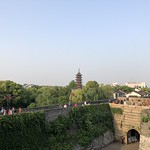

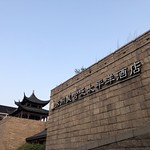

SUZ,Building Elements


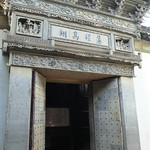

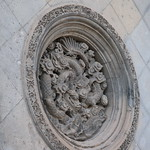

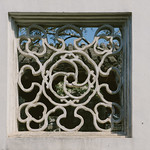

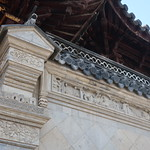

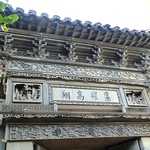

SUZ,Urban Form Elements


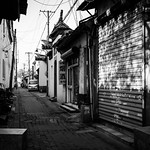

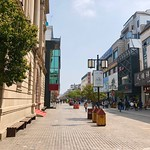

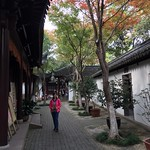

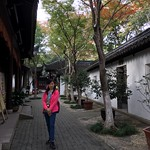

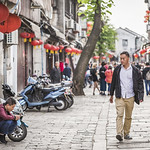

SUZ,Urban Scenery


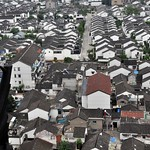

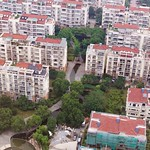

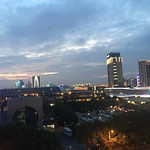

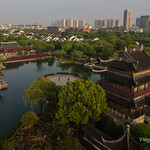

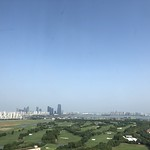

SUZ,Natural Features and Land-scape Scenery


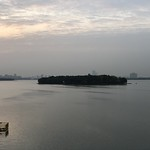

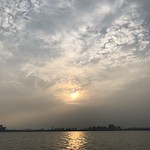

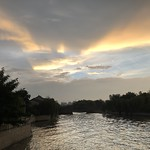

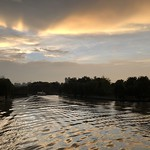

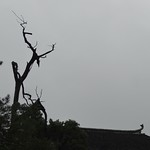

SUZ,Interior Scenery


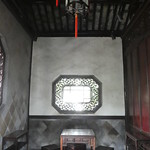

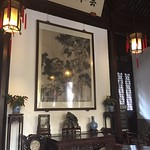

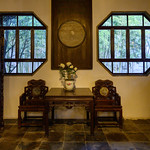

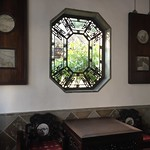

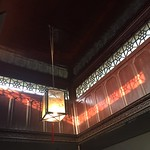

SUZ,People’s Activity and Association


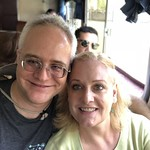

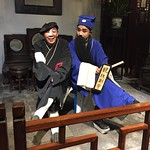

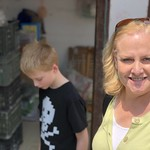

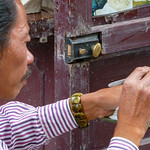

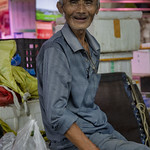

SUZ,Gastronomy


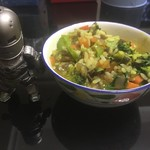

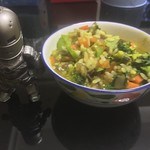

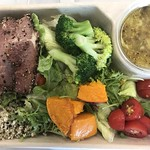

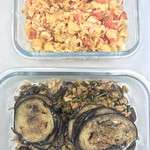

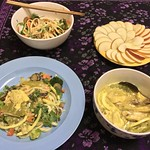

SUZ,Artifact Products


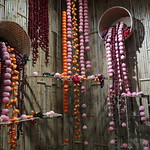

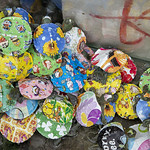

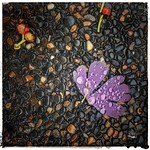

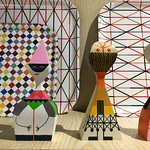

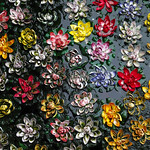

In [69]:
places='SUZ'
for types in cat_new:
    print('{},{}'.format(places,types))
    for name in list(pics[places][types].keys()):
        img, input_img = get_one_image_name(str(name), all_images=all_images_150_S, images_folder=images_folder_150_S)
        display(img)

SUZ,Monuments and Buildings


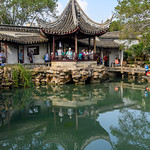

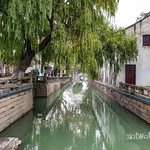

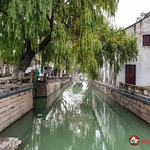

SUZ,Building Elements


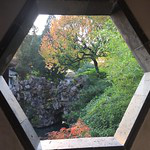

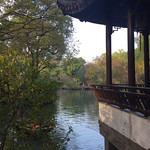

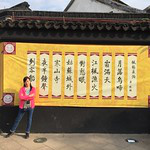

SUZ,Urban Form Elements


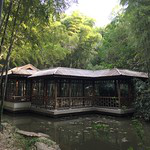

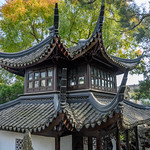

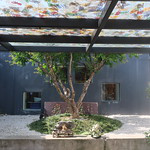

SUZ,Urban Scenery


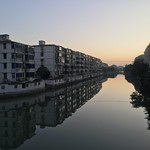

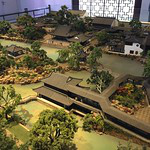

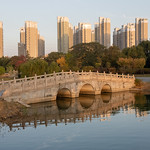

SUZ,Natural Features and Land-scape Scenery


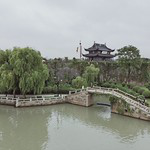

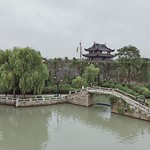

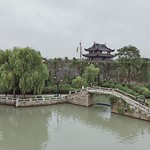

SUZ,Interior Scenery


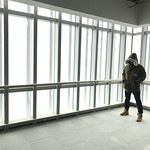

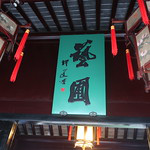

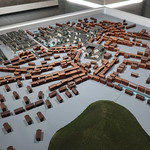

SUZ,People’s Activity and Association


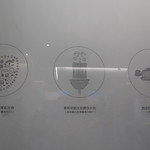

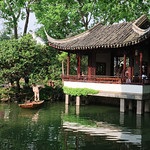

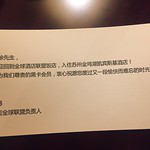

SUZ,Gastronomy


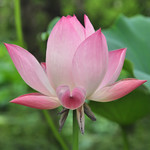

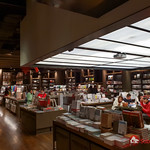

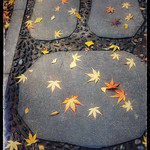

SUZ,Artifact Products


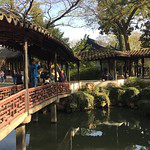

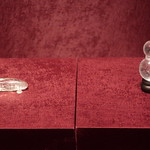

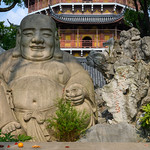

In [47]:
places='SUZ'
for types in cat_new:
    print('{},{}'.format(places,types))
    for name in list(pics_neg[places][types].keys()):
        img, input_img = get_one_image_name(str(name), all_images=all_images_150_S, images_folder=images_folder_150_S)
        display(img)

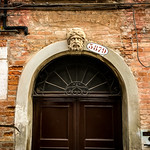

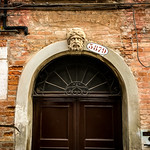

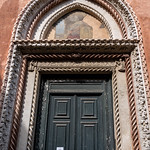

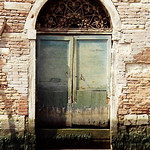

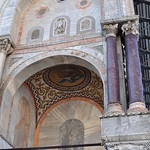

In [117]:
for name in list(pics['VEN']['Building Elements'].keys()):
    img, input_img = get_one_image_name(str(name), all_images=all_images_150, images_folder=images_folder_150)
    display(img)